##  Imports<a id='3.3_Imports'></a>

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
#from library.sb_utils import save_file


Objectives

To predict the number of accidents using environmental factors or weather conditions.

Null Hypothesis 1: Environmental factors do not contribute to car accidents significantly and cannot be used to predict the number of accidents.

Alternate Hypothesis: Environmental factors can be used to predict the number of accidents


## Load The Data<a id='3.4_Load_The_Data'></a>

In [2]:
df = pd.read_csv(r'C:\Users\Shweta\Documents\gitrepo\Capstonetwo\USaccidentsdata_cleaned.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2776051 entries, 0 to 2776050
Data columns (total 55 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Unnamed: 0             int64  
 1   ID                     object 
 2   Severity               int64  
 3   Start_Time             object 
 4   End_Time               object 
 5   Start_Lat              float64
 6   Start_Lng              float64
 7   End_Lat                float64
 8   End_Lng                float64
 9   Distance(mi)           float64
 10  Description            object 
 11  Number                 float64
 12  Street                 object 
 13  Side                   object 
 14  City                   object 
 15  County                 object 
 16  State                  object 
 17  Zipcode                object 
 18  Country                object 
 19  Timezone               object 
 20  Airport_Code           object 
 21  Weather_Timestamp      object 
 22  Temperature(F)    

In [4]:
# Changing settings in head function to view all columns.
pd.set_option('display.max_columns', 55)
pd.options.display.max_columns = 55
pd.set_option('display.max_columns', None)
df.head(50)


,Unnamed: 0,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Number,Street,Side,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Weather_Date,Weather_Time,Month&Year,StartDate,StartTime,EndDate,EndTime
0,0,A-1,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,NaN,Outerbelt E,R,Dublin,Franklin,OH,43017,US,US/Eastern,KOSU,2016-02-08 00:53:00,42.1,36.1,58.0,29.76,10.0,SW,10.4,0.00,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,2016-02-08,00:53:00,Feb 2016,2016-02-08,00:37:08,2016-02-08,06:37:08
1,1,A-2,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.865420,-84.062800,39.865010,-84.048730,0.747,At OH-4/OH-235/Exit 41 - Accident.,NaN,I-70 E,R,Dayton,Montgomery,OH,45424,US,US/Eastern,KFFO,2016-02-08 05:58:00,36.9,NaN,91.0,29.68,10.0,Calm,NaN,0.02,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,2016-02-08,05:58:00,Feb 2016,2016-02-08,05:56:20,2016-02-08,11:56:20
2,2,A-3,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.102660,-84.524680,39.102090,-84.523960,0.055,At I-71/US-50/Exit 1 - Accident.,NaN,I-75 S,R,Cincinnati,Hamilton,OH,45203,US,US/Eastern,KLUK,2016-02-08 05:53:00,36.0,NaN,97.0,29.70,10.0,Calm,NaN,0.02,Overcast,False,False,False,False,True,False,False,False,False,False,False,False,False,Night,Night,Night,Day,2016-02-08,05:53:00,Feb 2016,2016-02-08,06:15:39,2016-02-08,12:15:39
3,3,A-4,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.062130,-81.537840,41.062170,-81.535470,0.123,At Dart Ave/Exit 21 - Accident.,NaN,I-77 N,R,Akron,Summit,OH,44311,US,US/Eastern,KAKR,2016-02-08 06:54:00,39.0,NaN,55.0,29.65,10.0,Calm,NaN,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Day,Day,2016-02-08,06:54:00,Feb 2016,2016-02-08,06:51:45,2016-02-08,12:51:45
4,4,A-5,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,NaN,I-75 S,R,Cincinnati,Hamilton,OH,45217,US,US/Eastern,KLUK,2016-02-08 07:53:00,37.0,29.8,93.0,29.69,10.0,WSW,10.4,0.01,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2016-02-08,07:53:00,Feb 2016,2016-02-08,07:53:43,2016-02-08,13:53:43
5,5,A-6,2,2016-02-08 08:16:57,2016-02-08 14:16:57,39.063240,-84.032430,39.067310,-84.058510,1.427,At Dela Palma Rd - Accident.,NaN,State Route 32,R,Williamsburg,Clermont,OH,45176,US,US/Eastern,KI69,2016-02-08 08:16:00,35.6,29.2,100.0,29.66,10.0,WSW,8.1,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,True,False,Day,Day,Day,Day,2016-02-08,08:16:00,Feb 2016,2016-02-08,08:16:57,2016-02-08,14:16:57
6,6,A-7,2,2016-02-08 08:15:41,2016-02-08 14:15:41,39.775650,-84.186030,39.772750,-84.188050,0.227,At OH-4/Exit 54 - Accident.,NaN,I-75 S,R,Dayton,Montgomery,OH,45404,US,US/Eastern,KFFO,2016-02-08 08:18:00,33.8,NaN,100.0,29.63,3.0,SW,2.3,NaN,Mostly Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2016-02-08,08:18:00,Feb 2016,2016-02-08,08:15:41,2016-02-08,14:15:41
7,7,A-8,2,2016-02-08 11:51:46,2016-02-08 17:51:46,41.375310,-81.820170,41.367860,-81.821740,0.521,At Bagley Rd/Exit 235 - Accident.,NaN,I-71 S,R,Cleveland,Cuyahoga,OH,44130,US,US/Eastern,KCLE,2016-02-08 11:51:00,33.1,30.0,92.0,29.63,0.5,SW,3.5,0.08,Snow,False,False,False,False,True,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2016-02-08,11:51:00,Feb 2016,2016-02-08,11:51:46

## Explore The Data <a id='3.5_Explore_The_Data'></a>

In [5]:
state_summary_newind = df.set_index('State')
state_summary_newind.head()

,Unnamed: 0,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Number,Street,Side,City,County,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Weather_Date,Weather_Time,Month&Year,StartDate,StartTime,EndDate,EndTime
State,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
OH,0,A-1,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,NaN,Outerbelt E,R,Dublin,Franklin,43017,US,US/Eastern,KOSU,2016-02-08 00:53:00,42.1,36.1,58.0,29.76,10.0,SW,10.4,0.00,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,2016-02-08,00:53:00,Feb 2016,2016-02-08,00:37:08,2016-02-08,06:37:08
OH,1,A-2,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.865420,-84.062800,39.865010,-84.048730,0.747,At OH-4/OH-235/Exit 41 - Accident.,NaN,I-70 E,R,Dayton,Montgomery,45424,US,US/Eastern,KFFO,2016-02-08 05:58:00,36.9,NaN,91.0,29.68,10.0,Calm,NaN,0.02,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,2016-02-08,05:58:00,Feb 2016,2016-02-08,05:56:20,2016-02-08,11:56:20
OH,2,A-3,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.102660,-84.524680,39.102090,-84.523960,0.055,At I-71/US-50/Exit 1 - Accident.,NaN,I-75 S,R,Cincinnati,Hamilton,45203,US,US/Eastern,KLUK,2016-02-08 05:53:00,36.0,NaN,97.0,29.70,10.0,Calm,NaN,0.02,Overcast,False,False,False,False,True,False,False,False,False,False,False,False,False,Night,Night,Night,Day,2016-02-08,05:53:00,Feb 2016,2016-02-08,06:15:39,2016-02-08,12:15:39
OH,3,A-4,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.062130,-81.537840,41.062170,-81.535470,0.123,At Dart Ave/Exit 21 - Accident.,NaN,I-77 N,R,Akron,Summit,44311,US,US/Eastern,KAKR,2016-02-08 06:54:00,39.0,NaN,55.0,29.65,10.0,Calm,NaN,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Day,Day,2016-02-08,06:54:00,Feb 2016,2016-02-08,06:51:45,2016-02-08,12:51:45
OH,4,A-5,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,NaN,I-75 S,R,Cincinnati,Hamilton,45217,US,US/Eastern,KLUK,2016-02-08 07:53:00,37.0,29.8,93.0,29.69,10.0,WSW,10.4,0.01,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2016-02-08,07:53:00,Feb 2016,2016-02-08,07:53:43,2016-02-08,13:53:43


Text(0, 0.5, 'Total accidents from 2016 to 2021')

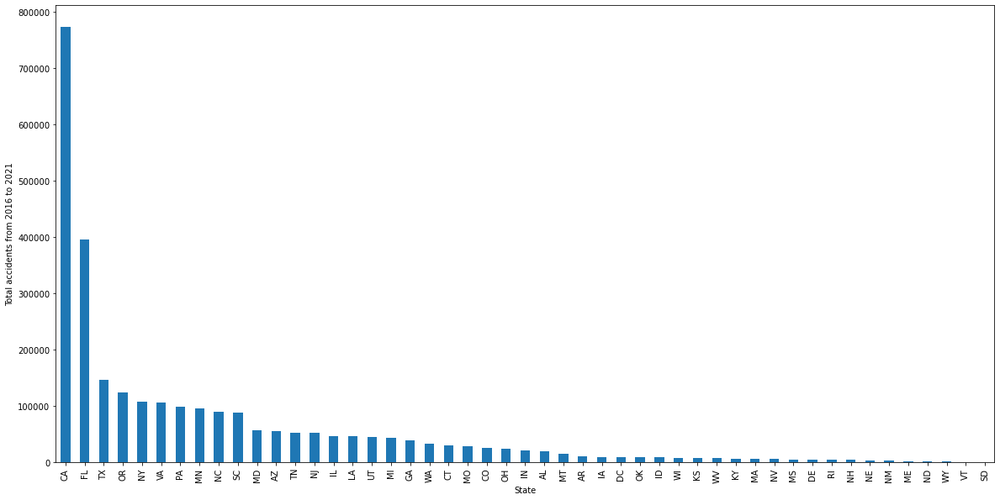

In [6]:
df['State'].value_counts().plot(kind='bar', figsize=(20,10))
plt.xlabel("State")
plt.ylabel("Total accidents from 2016 to 2021")

Most accidents are in the state of California, Florida. May be it corresponds to population density. Howevet that is not what we want to know. Since accidents are only our focus, let move on to check how severe are these accidents state-wise.

Comparing the statewise data with the population density could give us more insights. Could population density be causing more accidents? The bar graph above gives the total accidents from 2016 to 2021. 

###  Analysing Statewise population density and accidents<a id='3.5.1_Top_States_By_Order_Of_Each_Of_The_Summary_Statistics'></a>

In [7]:
#creating a subset with accidents occured in 2021
df_2021=df[(df['Month&Year'].str.contains('2021')) & (df['State'])]

In [8]:
df_2021.shape

(1479256, 55)

In [9]:
df_2021_comp=df_2021['State'].value_counts()
df_2021_comp= df_2021_comp.reset_index()# this is to give it new column names so that the resulting output is a dataframe & not series
df_2021_comp.columns = ['State', 'Total_Accidents_2021'] # assign new column names
df_2021_comp.head()

,State,Total_Accidents_2021
0,CA,378741
1,FL,275899
2,TX,82638
3,VA,67834
4,SC,65571


In [10]:
type(df_2021_comp)

pandas.core.frame.DataFrame

In [11]:
#read csv containing populn density data for 2021 downloaded from Statista.
popu_density_2021 = pd.read_csv(r'C:\Users\Shweta\Documents\gitrepo\Capstonetwo\Statewise_populn_density_2021.csv')

In [12]:
popu_density_2021.shape

(49, 2)

In [13]:
#Merge the two
df_2021_comp = df_2021_comp.merge(popu_density_2021, how='left', left_on ='State', right_on ='State')

In [14]:
df_2021_comp

,State,Total_Accidents_2021,Residents_per_sq_mile
0,CA,378741,251.90
1,FL,275899,406.34
2,TX,82638,113.04
3,VA,67834,218.83
4,SC,65571,172.62
5,PA,63951,289.77
6,NY,55915,420.91
7,MN,50600,71.69
8,NC,49725,217.02
9,OR,44473,44.24


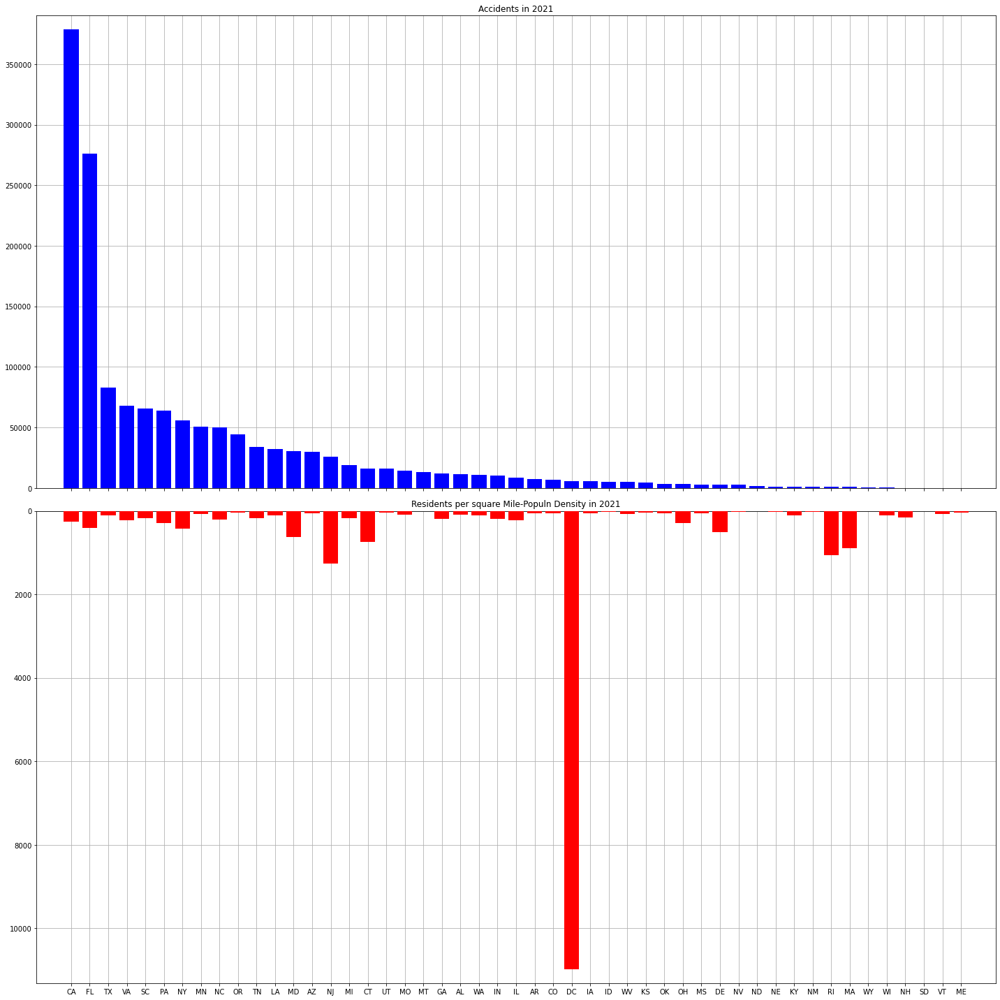

In [15]:
# plotting a vertical subplots to compare numnber of accidents in each state with the populn density

fig, axes = plt.subplots(nrows=2, sharex=True, figsize=(20,20))

axes[0].bar(df_2021_comp.State, df_2021_comp.Total_Accidents_2021, align='center', color='blue', zorder=10) 
axes[0].set(title='Accidents in 2021')

axes[1].bar(df_2021_comp.State, df_2021_comp.Residents_per_sq_mile, align='center', color='red', zorder=10)
axes[1].set(title='Residents per square Mile-Populn Density in 2021')

axes[1].invert_yaxis()
axes[0].set(xticks=df_2021_comp.State, xticklabels=df_2021_comp.State)


for ax in axes.flat:
    ax.margins(0.03)
    ax.grid(True)

fig.tight_layout()
fig.subplots_adjust(wspace=0.02)
plt.show()


Population Density does not seem to influence the number of accidents. 

###  Analysing Statewise data with order to severity<a id='3.5.1_Top_States_By_Order_Of_Each_Of_The_Summary_Statistics'></a>

In [16]:
# Creating a subset with states and severity
State_severity=df[['State','Severity']]
State_severity.head()

,State,Severity
0,OH,3
1,OH,2
2,OH,2
3,OH,2
4,OH,3


In [17]:
# Counting the each category of severity for every state
temp1=State_severity.pivot_table(index='State', columns='Severity', aggfunc='size')
print(temp1)

Severity       1         2        3       4
State                                      
AL         110.0   17269.0    762.0   896.0
AR          11.0    9249.0    288.0  1236.0
AZ        6036.0   43365.0   2080.0  3743.0
CA        4955.0  739758.0  19762.0  8859.0
CO         427.0   11709.0   8691.0  4077.0
CT           4.0   24662.0   2095.0  2878.0
DC          35.0    7777.0    334.0   636.0
DE           7.0    3418.0    367.0  1032.0
FL        2773.0  372700.0  11292.0  9370.0
GA         346.0   25326.0   6359.0  7180.0
IA           3.0    7511.0    456.0  1447.0
ID           NaN    7909.0    113.0   447.0
IL         249.0   23900.0  19643.0  3191.0
IN          41.0   14433.0   2682.0  3403.0
KS           5.0    6529.0    653.0   410.0
KY          33.0    5048.0    692.0   788.0
LA         999.0   43181.0   1171.0  1140.0
MA         127.0    4210.0   1603.0   412.0
MD         225.0   44650.0   4688.0  7015.0
ME           NaN    2037.0     36.0    95.0
MI          28.0   34457.0   372

<AxesSubplot:ylabel='State'>

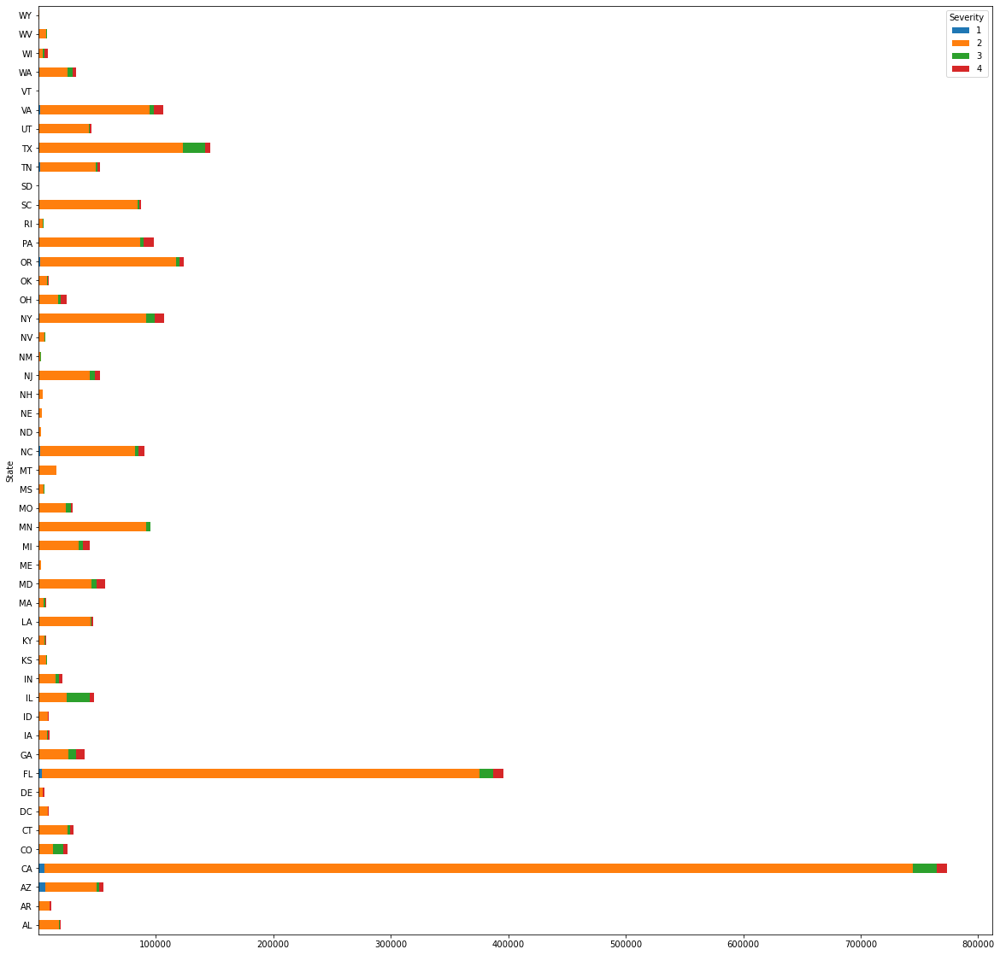

In [18]:
State_severity.pivot_table(index='State', columns='Severity', aggfunc='size').plot.barh(stacked=True, figsize=(20,20))

It is to be noted that '1' indicates least severe accidents. The above plot tells us that states CO, IL, and TX have a sizeable proportion of type 3 severe and above accidents. Severity can be a target variable that we can predict.

###  Analysing Sunset-Sunrise with number of accidents<a id='3.5.1_Top_States_By_Order_Of_Each_Of_The_Summary_Statistics'></a>

Twilight is the time between day and night when there is light outside, but the Sun is below the horizon.
Types of Twilight
There are three types of twilight:
Civil twilight
Civil twilight is the brightest form of twilight. There is enough natural sunlight during this period that artificial light may not be required to carry out outdoor activities.

Nautical twilight
This twilight period is less bright than civil twilight and artificial light is generally required for outdoor activities.
During this time, most stars can be easily seen with naked eyes, and the horizon is usually also visible in clear weather conditions.
    
Astronomical twilight
During astronomical twilight, most celestial objects can be observed in the sky. However, the atmosphere still scatters and refracts a small amount of sunlight, and that may make it difficult for astronomers to view the faintest objects.




In [19]:
#Lets filter the relevant columns to understand it better
df1=df[['Timezone','Sunrise_Sunset','Civil_Twilight','Nautical_Twilight','Astronomical_Twilight','StartTime','Month&Year']]

In [20]:
df1[(df1['Sunrise_Sunset'] == 'Night') & (df1['Astronomical_Twilight'] == 'Day')].head(300)


,Timezone,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,StartTime,Month&Year
2,US/Eastern,Night,Night,Night,Day,06:15:39,Feb 2016
3,US/Eastern,Night,Night,Day,Day,06:51:45,Feb 2016
14,US/Eastern,Night,Day,Day,Day,18:11:11,Feb 2016
15,US/Eastern,Night,Day,Day,Day,18:11:11,Feb 2016
23,US/Eastern,Night,Night,Night,Day,06:10:59,Feb 2016
...,...,...,...,...,...,...,...
2353,US/Pacific,Night,Day,Day,Day,20:00:04,Apr 2016
2354,US/Pacific,Night,Day,Day,Day,20:10:01,Apr 2016
2355,US/Pacific,Night,Night,Day,Day,20:18:07,Apr 2016
2356,US/Pacific,Night,Night,Day,Day,20:20:25,Apr 2016


The above rows indicate sunset phases. 
The order during Sunset is - Sunset, Civil Twilight/Dusk, Nautical Twilight/Dusk, Astronomical Twilight/Dusk and then Night. 
The order during Sunrise is - Astronomical Twilight/Dawn, Nautical Twilight/Dawn, Civil Twilight/Dawn and then Sunrise. 

However the rows below are not exactly following the order. For instance index 127921 shows a Twilight at 3:00 PM in Jun PST. This is very unlikely because Jun is a summer month and 3:00 PM cannot be a twilight time. Similarly index 243701 indicates Twilight at 1:pm in Jun PST, which is also unlikely. 

Hence we may be looking at erroneous data.To be on safer side and avoid misinterpretation, we can consolidate all the twilights into one single column or we can just prefer to leave them out and consider Sunset and Sunrise only. Since there is possiblity of erroneous Twilight data skewing the results, we would prefer to go with the latter option.

In [21]:
df1[(df1['Sunrise_Sunset'] == 'Day') & (df1['Astronomical_Twilight'] == 'Night')].head(300)

,Timezone,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,StartTime,Month&Year
93380,US/Mountain,Day,Day,Day,Night,14:26:10,Jul 2016
127843,US/Pacific,Day,Day,Day,Night,14:42:11,Jun 2016
127921,US/Pacific,Day,Day,Day,Night,15:04:00,Jun 2016
127926,US/Pacific,Day,Day,Day,Night,15:28:49,Jun 2016
128077,US/Pacific,Day,Day,Day,Night,14:18:24,Jun 2016
...,...,...,...,...,...,...,...
236885,US/Central,Day,Day,Day,Night,20:49:00,Jul 2021
237747,US/Pacific,Day,Day,Day,Night,14:47:00,Jun 2021
242329,US/Central,Day,Day,Day,Night,15:38:00,Jun 2021
243701,US/Pacific,Day,Day,Day,Night,13:23:36,Jun 2021


###  Analysing Weather Conditions with number of accidents<a id='3.5.1_Top_States_By_Order_Of_Each_Of_The_Summary_Statistics'></a>

In [22]:
# Lets check how weather conditions impact accidents.Checking the unique values.
df['Weather_Condition'].unique()
# this shows a lot of unique values

array(['Light Rain', 'Overcast', 'Mostly Cloudy', 'Snow', 'Light Snow',
       'Cloudy', nan, 'Scattered Clouds', 'Clear', 'Partly Cloudy',
       'Light Freezing Drizzle', 'Light Drizzle', 'Haze', 'Rain',
       'Heavy Rain', 'Fair', 'Drizzle', 'Fog', 'Thunderstorms and Rain',
       'Patches of Fog', 'Light Thunderstorms and Rain', 'Mist',
       'Rain Showers', 'Light Rain Showers', 'Heavy Drizzle', 'Smoke',
       'Light Freezing Fog', 'Light Freezing Rain', 'Blowing Snow',
       'Heavy Thunderstorms and Rain', 'Heavy Snow', 'Snow Grains',
       'Squalls', 'Light Fog', 'Shallow Fog', 'Thunderstorm',
       'Light Ice Pellets', 'Thunder', 'Thunder in the Vicinity',
       'Fair / Windy', 'Light Rain with Thunder',
       'Heavy Thunderstorms and Snow', 'Light Snow Showers',
       'Cloudy / Windy', 'Ice Pellets', 'N/A Precipitation',
       'Light Thunderstorms and Snow', 'T-Storm', 'Rain / Windy',
       'Wintry Mix', 'Partly Cloudy / Windy', 'Heavy T-Storm',
       'Light Rain /

In [23]:
#get counts of each variable value
pd.set_option("display.max_rows", None)
df.Weather_Condition.value_counts()

Fair                                   1102071
Mostly Cloudy                           362941
Cloudy                                  347502
Partly Cloudy                           248959
Clear                                   173101
Light Rain                              128011
Overcast                                 84614
Scattered Clouds                         44921
Light Snow                               43606
Fog                                      41001
Haze                                     36094
Rain                                     30854
Fair / Windy                             15062
Heavy Rain                               11731
Smoke                                     7189
Light Drizzle                             7014
Thunder in the Vicinity                   6891
Cloudy / Windy                            6796
T-Storm                                   6520
Mostly Cloudy / Windy                     6289
Thunder                                   6001
Light Rain wi

The number of categorical values in Weather_Condition can be preferably reduced to a few buckets, so as to aid in analysis. This is called reducing the dimensionality. We notice that Wind speed has been already captured as a variable. So having entries like-"Partly Cloudy/Windy", "Light Rain/Windy" are just redundant information. Similarly Cloudy and overcast mean the same. This will be taken up further in pre-processing stage.

The above numbers help us get a fair understanding of weather conditions with most accidents. However lets normalise this with the accidents in a month and in a state to understand if there are accidents on days when the weather is not reported. For instance we could choose california with highest accidents of we could choose another state which shows the most varaiation in weather conditions.

In [24]:
# Normalizing weather conditions statewise.
#First, we will check statewise weather condition details. This will help us choose a state for further analysis.
#Creating a subset
state_weather=df[['Weather_Condition','State']]


In [25]:
# Counting the each category of severity for every state
temp1=state_weather.pivot_table(index='Weather_Condition', columns='State', aggfunc='size')
print(temp1)

State                                    AL      AR       AZ        CA  \
Weather_Condition                                                        
Blowing Dust                            NaN     NaN      1.0      73.0   
Blowing Dust / Windy                    NaN     NaN      NaN     104.0   
Blowing Sand                            NaN     NaN      NaN       1.0   
Blowing Snow                            NaN     NaN      NaN       NaN   
Blowing Snow / Windy                    NaN     NaN      NaN       NaN   
Blowing Snow Nearby                     NaN     NaN      NaN       NaN   
Clear                                 660.0   194.0   5059.0   55389.0   
Cloudy                               3237.0  2008.0   2123.0   77617.0   
Cloudy / Windy                         23.0    13.0     40.0     957.0   
Drifting Snow                           NaN     NaN      NaN       NaN   
Drizzle                                 7.0     NaN      1.0     409.0   
Drizzle / Windy                       

In [26]:
# converting the above pivot to dataframe
temp1_df = temp1.reset_index()
temp1_df

State,Weather_Condition,AL,AR,AZ,CA,CO,CT,DC,DE,FL,GA,IA,ID,IL,IN,KS,KY,LA,MA,MD,ME,MI,MN,MO,MS,MT,NC,ND,NE,NH,NJ,NM,NV,NY,OH,OK,OR,PA,RI,SC,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
0,Blowing Dust,NaN,NaN,1.0,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,1.0,NaN,NaN,NaN,NaN,NaN,61.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN
1,Blowing Dust / Windy,NaN,NaN,NaN,104.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,5.0,NaN,NaN,NaN,NaN,NaN,13.0,4.0,NaN,NaN,7.0,NaN,NaN,NaN
2,Blowing Sand,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Blowing Snow,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,NaN,NaN,3.0,2.0,1.0,3.0,2.0,NaN,NaN,4.0,NaN,NaN,12.0,61.0,1.0,NaN,1.0,NaN,NaN,1.0,2.0,13.0,NaN,NaN,39.0,1.0,1.0,NaN,2.0,1.0,NaN,NaN,NaN,NaN,2.0,1.0,NaN,NaN,3.0,NaN,NaN
4,Blowing Snow / Windy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0,4.0,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,5.0,46.0,NaN,NaN,NaN,NaN,3.0,1.0,NaN,NaN,NaN,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,4.0
5,Blowing Snow Nearby,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Clear,660.0,194.0,5059.0,55389.0,2558.0,2680.0,84.0,442.0,11218.0,5411.0,723.0,572.0,6403.0,1888.0,838.0,866.0,881.0,837.0,3318.0,375.0,4428.0,3117.0,3589.0,475.0,91.0,3966.0,8.0,406.0,589.0,4249.0,258.0,1464.0,5111.0,4054.0,754.0,8500.0,3094.0,462.0,1942.0,11.0,1129.0,10802.0,3432.0,4913.0,27.0,3599.0,1794.0,345.0,96.0
7,Cloudy,3237.0,2008.0,2123.0,77617.0,1656.0,4423.0,1559.0,590.0,35810.0,4291.0,1526.0,1224.0,4696.0,3396.0,991.0,740.0,7836.0,707.0,9609.0,150.0,7414.0,17744.0,3500.0,748.0,3956.0,12098.0,299.0,500.0,258.0,7563.0,81.0,291.0,16731.0,2327.0,730.0,22094.0,19907.0,347.0,12925.0,20.0,7512.0,18150.0,4521.0,16451.0,39.0,5422.0,439.0,1110.0,136.0
8,Cloudy / Windy,23.0,13.0,40.0,957.0,71.0,92.0,32.0,10.0,650.0,16.0,111.0,24.0,182.0,78.0,33.0,12.0,169.0,21.0,97.0,2.0,225.0,592.0,108.0,5.0,145.0,56.0,58.0,18.0,3.0,137.0,8.0,8.0,517.0,134.0,92.0,540.0,326.0,3.0,58.0,5.0,63.0,394.0,287.0,242.0,NaN,79.0,12.0,10.0,38.0
9,Drifting Snow,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
# checking for null values in each column. 
temp1_df.isnull().sum().sort_values()

State
Weather_Condition      0
TX                    47
CA                    50
NY                    53
NJ                    57
MN                    58
VA                    60
PA                    61
OR                    62
CO                    63
MD                    63
UT                    65
MI                    66
IL                    66
OH                    70
NC                    70
MO                    70
FL                    70
GA                    71
AZ                    71
CT                    72
IA                    73
IN                    74
WI                    75
SC                    75
TN                    75
WA                    75
AR                    77
NE                    77
LA                    79
RI                    81
OK                    81
ID                    81
MT                    82
AL                    82
KS                    82
NH                    84
WV                    84
MA                    85
KY                 

TX, CA and NY show least number of missing values, which means they have varied weather conditions. We can choose California here because  it also records the highest number of accidents. Now lets create a subset for the state of California. We will need columns of Weather conditions and weather dates.

In [28]:
CA_weather=df[['Weather_Date','Weather_Condition','State']]
CA_weather = CA_weather[(CA_weather['State'] == 'CA')]
CA_weather.head()

,Weather_Date,Weather_Condition,State
984,2016-03-22,Clear,CA
985,2016-03-22,Scattered Clouds,CA
986,2016-03-22,Partly Cloudy,CA
987,2016-03-22,Clear,CA
988,2016-03-22,Clear,CA


In [29]:
CA_weather.pivot_table(index='Weather_Date', columns='Weather_Condition', aggfunc='size')

Weather_Condition,Blowing Dust,Blowing Dust / Windy,Blowing Sand,Clear,Cloudy,Cloudy / Windy,Drizzle,Drizzle / Windy,Dust Whirls,Duststorm,Fair,Fair / Windy,Fog,Fog / Windy,Hail,Haze,Haze / Windy,Heavy Drizzle,Heavy Rain,Heavy Rain / Windy,Heavy Rain Shower,Heavy Snow,Heavy Snow / Windy,Heavy T-Storm,Heavy Thunderstorms and Rain,Light Drizzle,Light Drizzle / Windy,Light Freezing Fog,Light Freezing Rain,Light Rain,Light Rain / Windy,Light Rain Shower,Light Rain Shower / Windy,Light Rain Showers,Light Rain with Thunder,Light Snow,Light Snow / Windy,Light Snow Showers,Light Thunderstorms and Rain,Mist,Mostly Cloudy,Mostly Cloudy / Windy,N/A Precipitation,Overcast,Partial Fog,Partly Cloudy,Partly Cloudy / Windy,Patches of Fog,Rain,Rain / Windy,Rain Shower,Rain Showers,Sand / Windy,Scattered Clouds,Shallow Fog,Showers in the Vicinity,Smoke,Smoke / Windy,Snow,Snow / Windy,Squalls,Squalls / Windy,T-Storm,T-Storm / Windy,Thunder,Thunder / Windy,Thunder and Hail,Thunder in the Vicinity,Thunderstorm,Thunderstorms and Rain,Volcanic Ash,Widespread Dust,Widespread Dust / Windy,Wintry Mix,Wintry Mix / Windy
Weather_Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-03-22,NaN,NaN,NaN,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-23,NaN,NaN,NaN,118.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,NaN,NaN,NaN,NaN,12.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-24,NaN,NaN,NaN,106.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,1.0,NaN,16.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-25,NaN,NaN,NaN,89.0,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,NaN,12.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-26,NaN,NaN,NaN,14.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-27,NaN,NaN,NaN,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-28,NaN,NaN,NaN,24.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,23.0,NaN,NaN,10.0,NaN,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-29,NaN,NaN,NaN,58.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,25.0,NaN,NaN,10.0,NaN,21.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,27.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-30,NaN,NaN,NaN,68.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,NaN,NaN,6.0,NaN,26.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

Lets analyze data for the state of California. Since CA represents a good variety of weather conditions and also has the highest number of accidents, an analysis of data from this state can be considered a representative of the larger dataframe.

In [30]:
New_df = df[df['State'] == 'CA']

In [31]:
New_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 773334 entries, 984 to 2776050
Data columns (total 55 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Unnamed: 0             773334 non-null  int64  
 1   ID                     773334 non-null  object 
 2   Severity               773334 non-null  int64  
 3   Start_Time             773334 non-null  object 
 4   End_Time               773334 non-null  object 
 5   Start_Lat              773334 non-null  float64
 6   Start_Lng              773334 non-null  float64
 7   End_Lat                773334 non-null  float64
 8   End_Lng                773334 non-null  float64
 9   Distance(mi)           773334 non-null  float64
 10  Description            773334 non-null  object 
 11  Number                 249252 non-null  float64
 12  Street                 773334 non-null  object 
 13  Side                   773334 non-null  object 
 14  City                   773327 non

In [32]:
New_df['Weather_Condition'].unique()

array(['Clear', 'Scattered Clouds', 'Partly Cloudy', 'Mostly Cloudy', nan,
       'Overcast', 'Snow', 'Light Rain', 'Light Snow', 'Patches of Fog',
       'Rain', 'Fair', 'Light Drizzle', 'Heavy Rain', 'Haze', 'Fog',
       'Cloudy', 'Light Thunderstorms and Rain', 'Mist', 'Rain Showers',
       'Light Rain Showers', 'Drizzle', 'Heavy Drizzle', 'Smoke',
       'Widespread Dust', 'Blowing Dust / Windy', 'Blowing Dust',
       'Cloudy / Windy', 'Rain / Windy', 'Volcanic Ash', 'Shallow Fog',
       'Thunderstorms and Rain', 'Heavy Thunderstorms and Rain',
       'Mostly Cloudy / Windy', 'Light Snow Showers',
       'Light Rain / Windy', 'Heavy Rain / Windy',
       'Partly Cloudy / Windy', 'Squalls', 'Fair / Windy', 'Fog / Windy',
       'Dust Whirls', 'N/A Precipitation', 'Snow / Windy',
       'Showers in the Vicinity', 'Wintry Mix', 'Heavy Snow',
       'Thunder in the Vicinity', 'T-Storm', 'Thunder', 'Haze / Windy',
       'Light Rain Shower', 'Heavy Snow / Windy', 'Heavy T-Storm',
  

We are now having fewer dimensions in the category 'Weather Conditions'. Lets see if we can reduce this further.

In [33]:
pd.set_option("display.max_rows", None)
New_df.Weather_Condition.value_counts()

Fair                            398520
Cloudy                           77617
Mostly Cloudy                    64181
Clear                            55389
Partly Cloudy                    53488
Haze                             27633
Light Rain                       26235
Fog                              15265
Overcast                         12492
Rain                              9772
Scattered Clouds                  7259
Fair / Windy                      5373
Smoke                             5069
Heavy Rain                        3625
Light Snow                        1151
Cloudy / Windy                     957
Mostly Cloudy / Windy              771
Partly Cloudy / Windy              751
Light Rain / Windy                 751
Rain / Windy                       454
Snow                               444
Light Drizzle                      433
Drizzle                            409
Heavy Rain / Windy                 284
Mist                               266
Patches of Fog           

In [34]:
#replacing the nan and N/A Precipitation entries with Other
New_df["Weather_Condition"].fillna("No Data", inplace = True)

C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\3732520975.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_df["Weather_Condition"].fillna("No Data", inplace = True)


In [35]:
New_df[New_df['Weather_Condition'].str.contains('Thunder')]

,Unnamed: 0,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Number,Street,Side,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Weather_Date,Weather_Time,Month&Year,StartDate,StartTime,EndDate,EndTime
5612,5660,A-5661,2,2016-03-29 18:01:42,2016-03-30 00:01:42,34.071720,-117.613310,34.069000,-117.607440,0.385,At Vineyard Ave/Exit 54 - Accident.,NaN,I-10 E,R,Ontario,San Bernardino,CA,91764,US,US/Pacific,KONT,2016-03-29 17:53:00,51.1,NaN,66.0,29.88,6.0,West,16.1,0.03,Light Thunderstorms and Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2016-03-29,17:53:00,Mar 2016,2016-03-29,18:01:42,2016-03-30,00:01:42
109300,111895,A-111896,2,2017-01-20 04:37:51,2017-01-20 10:37:51,37.726040,-122.446240,37.725420,-122.446700,0.050,At Ocean Ave - Accident.,NaN,I-280 S,R,San Francisco,San Francisco,CA,94112,US,US/Pacific,KSFO,2017-01-20 04:38:00,48.0,NaN,80.0,29.38,3.0,SW,15.0,0.46,Light Thunderstorms and Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,2017-01-20,04:38:00,Jan 2017,2017-01-20,04:37:51,2017-01-20,10:37:51
109675,112283,A-112284,2,2017-01-23 08:47:02,2017-01-23 14:47:02,37.583822,-122.251333,37.583947,-122.251197,0.011,At San Mateo Bridge - Accident.,NaN,J Arthur Younger Fwy W,R,San Mateo,San Mateo,CA,94404,US,US/Pacific,KSQL,2017-01-23 08:47:00,46.4,45.2,87.0,29.87,10.0,Variable,3.5,NaN,Light Thunderstorms and Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2017-01-23,08:47:00,Jan 2017,2017-01-23,08:47:02,2017-01-23,14:47:02
110223,112838,A-112839,3,2016-10-24 07:09:33,2016-10-24 13:09:33,33.866400,-117.261500,33.865386,-117.261050,0.075,At Harley Knox Blvd - Accident.,NaN,I-215 S,R,March Air Reserve Base,Riverside,CA,92518,US,US/Pacific,KRIV,2016-10-24 07:11:00,62.6,NaN,100.0,30.09,8.0,North,3.5,NaN,Thunderstorms and Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2016-10-24,07:11:00,Oct 2016,2016-10-24,07:09:33,2016-10-24,13:09:33
110256,112871,A-112872,3,2016-10-24 11:52:03,2016-10-24 17:52:03,34.000150,-117.352630,34.002640,-117.350990,0.196,At Columbia Ave - Accident.,NaN,I-215 N,R,Riverside,Riverside,CA,92501,US,US/Pacific,KRAL,2016-10-24 11:53:00,64.0,NaN,78.0,30.06,4.0,North,3.5,0.07,Heavy Thunderstorms and Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2016-10-24,11:53:00,Oct 2016,2016-10-24,11:52:03,2016-10-24,17:52:03
110272,112889,A-112890,4,2016-10-24 13:24:47,2016-10-24 19:24:47,34.064410,-117.301590,34.059760,-117.297660,0.392,Ramp closed to I-10 - Road closed due to accid...,NaN,I-10 E,R,Colton,San Bernardino,CA,92324,US,US/Pacific,KSBD,2016-10-24 13:51:00,64.4,NaN,83.0,30.09,7.0,South,6.9,NaN,Thunderstorms and Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2016-10-24,13:51:00,Oct 2016,2016-10-24,13:24:47,2016-10-24,19:24:47
110305,112922,A-112923,2,2016-10-24 16:04:53,2016-10-24 22:04:53,34.051660,-117.160780,34.054600,-117.163390,0.252,At Cypress Ave/Exit 80 - Accident.,1200.0,E Palm Ave,R,Redlands,San Bernardino,CA,92374-5431,US,US/Pacific,KSBD,2016-10-24 15:49:00,64.4,NaN,77.0,30.08,6.0,SSE,8.1,NaN,Light Thunderstorms and Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2016-10-24,15:49:00,Oct 2016,2016-10-24,16:04:53,2016-10-24,22:04:53
110306,112923,A-112924,2,2016-10-24 16:09:01,2016-10-24 22:09:01,34.143244,-117.256491,34.143640,-117.259669,0.184,At Del R

In [36]:
New_df['Weather_Condition'] = New_df['Weather_Condition'].str.replace('Clear','Fair')


C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\1559923198.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_df['Weather_Condition'] = New_df['Weather_Condition'].str.replace('Clear','Fair')


In [37]:
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Cloudy" if ('Cloudy' in x) or ('%Cloud%' in x) else x)

C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\2260817134.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Cloudy" if ('Cloudy' in x) or ('%Cloud%' in x) else x)


In [38]:
New_df['Weather_Condition'].unique()

array(['Fair', 'Scattered Clouds', 'Cloudy', 'No Data', 'Overcast',
       'Snow', 'Light Rain', 'Light Snow', 'Patches of Fog', 'Rain',
       'Light Drizzle', 'Heavy Rain', 'Haze', 'Fog',
       'Light Thunderstorms and Rain', 'Mist', 'Rain Showers',
       'Light Rain Showers', 'Drizzle', 'Heavy Drizzle', 'Smoke',
       'Widespread Dust', 'Blowing Dust / Windy', 'Blowing Dust',
       'Rain / Windy', 'Volcanic Ash', 'Shallow Fog',
       'Thunderstorms and Rain', 'Heavy Thunderstorms and Rain',
       'Light Snow Showers', 'Light Rain / Windy', 'Heavy Rain / Windy',
       'Squalls', 'Fair / Windy', 'Fog / Windy', 'Dust Whirls',
       'N/A Precipitation', 'Snow / Windy', 'Showers in the Vicinity',
       'Wintry Mix', 'Heavy Snow', 'Thunder in the Vicinity', 'T-Storm',
       'Thunder', 'Haze / Windy', 'Light Rain Shower',
       'Heavy Snow / Windy', 'Heavy T-Storm', 'Light Snow / Windy',
       'Light Rain with Thunder', 'Rain Shower', 'Wintry Mix / Windy',
       'Widespread Du

In [39]:
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Thunderstorm & Rain" if 'Thunderstorms and Rain' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Fog" if 'Fog' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Rain" if ('Light Rain' in x) or ('Heavy Rain' in x) or ('Rain Shower%' in x) else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Freezing Rain" if 'Freezing Rain' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Blowing Snow" if 'Blowing Snow' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Drifting Snow" if 'Drifting Snow' in x else x)

C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\728098233.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Thunderstorm & Rain" if 'Thunderstorms and Rain' in x else x)
C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\728098233.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Fog" if 'Fog' in x else x)
C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\72

In [40]:
New_df['Weather_Condition'].unique()

array(['Fair', 'Scattered Clouds', 'Cloudy', 'No Data', 'Overcast',
       'Snow', 'Rain', 'Light Snow', 'Fog', 'Light Drizzle', 'Haze',
       'Thunderstorm & Rain', 'Mist', 'Rain Showers', 'Drizzle',
       'Heavy Drizzle', 'Smoke', 'Widespread Dust',
       'Blowing Dust / Windy', 'Blowing Dust', 'Rain / Windy',
       'Volcanic Ash', 'Light Snow Showers', 'Squalls', 'Fair / Windy',
       'Dust Whirls', 'N/A Precipitation', 'Snow / Windy',
       'Showers in the Vicinity', 'Wintry Mix', 'Heavy Snow',
       'Thunder in the Vicinity', 'T-Storm', 'Thunder', 'Haze / Windy',
       'Heavy Snow / Windy', 'Heavy T-Storm', 'Light Snow / Windy',
       'Rain Shower', 'Wintry Mix / Windy', 'Widespread Dust / Windy',
       'Sand / Windy', 'Smoke / Windy', 'T-Storm / Windy',
       'Light Drizzle / Windy', 'Squalls / Windy', 'Duststorm',
       'Thunder / Windy', 'Thunder and Hail', 'Blowing Sand',
       'Freezing Rain', 'Drizzle / Windy', 'Hail', 'Thunderstorm'],
      dtype=object)

In [41]:
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Blowing Dust" if 'Blowing Dust' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Drifting Snow" if 'Drifting Snow' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Dust" if 'Widespread Dust' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Thunderstorm" if 'T-Storm' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Haze" if 'Haze' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Snow" if 'Light Snow' in x else x)

C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\408546215.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Blowing Dust" if 'Blowing Dust' in x else x)
C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\408546215.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Drifting Snow" if 'Drifting Snow' in x else x)
C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848

In [42]:
New_df['Weather_Condition'].unique()

array(['Fair', 'Scattered Clouds', 'Cloudy', 'No Data', 'Overcast',
       'Snow', 'Rain', 'Fog', 'Light Drizzle', 'Haze',
       'Thunderstorm & Rain', 'Mist', 'Rain Showers', 'Drizzle',
       'Heavy Drizzle', 'Smoke', 'Dust', 'Blowing Dust', 'Rain / Windy',
       'Volcanic Ash', 'Squalls', 'Fair / Windy', 'Dust Whirls',
       'N/A Precipitation', 'Snow / Windy', 'Showers in the Vicinity',
       'Wintry Mix', 'Heavy Snow', 'Thunder in the Vicinity',
       'Thunderstorm', 'Thunder', 'Heavy Snow / Windy', 'Rain Shower',
       'Wintry Mix / Windy', 'Sand / Windy', 'Smoke / Windy',
       'Light Drizzle / Windy', 'Squalls / Windy', 'Duststorm',
       'Thunder / Windy', 'Thunder and Hail', 'Blowing Sand',
       'Freezing Rain', 'Drizzle / Windy', 'Hail'], dtype=object)

In [43]:
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Rain" if ('Rain Showers' in x) or ('Rain Shower' in x) else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Snow" if 'Heavy Snow' in x or 'Snow / Windy' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Drizzle" if 'Drizzle' in x else x)

C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\2013238809.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Rain" if ('Rain Showers' in x) or ('Rain Shower' in x) else x)
C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\2013238809.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Snow" if 'Heavy Snow' in x or 'Snow / Windy' in x else x)
C:\Users\Shweta\App

In [44]:
New_df['Weather_Condition'].unique()

array(['Fair', 'Scattered Clouds', 'Cloudy', 'No Data', 'Overcast',
       'Snow', 'Rain', 'Fog', 'Drizzle', 'Haze', 'Thunderstorm & Rain',
       'Mist', 'Smoke', 'Dust', 'Blowing Dust', 'Rain / Windy',
       'Volcanic Ash', 'Squalls', 'Fair / Windy', 'Dust Whirls',
       'N/A Precipitation', 'Showers in the Vicinity', 'Wintry Mix',
       'Thunder in the Vicinity', 'Thunderstorm', 'Thunder',
       'Wintry Mix / Windy', 'Sand / Windy', 'Smoke / Windy',
       'Squalls / Windy', 'Duststorm', 'Thunder / Windy',
       'Thunder and Hail', 'Blowing Sand', 'Freezing Rain', 'Hail'],
      dtype=object)

In [45]:
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Cloudy" if ('Clouds' in x) or ('Overcast' in x) else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "No Data" if ('N/A Precipitation' in x) or ('Vicinity' in x) else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Squalls" if 'Squalls' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Fair" if 'Fair' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Rain" if 'Rain / Windy' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Drizzle" if 'Drizzle' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Sand" if 'Sand / Windy' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Smoke" if 'Smoke / Windy' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Wintry Mix" if 'Wintry Mix' in x else x)

C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\2498375184.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Cloudy" if ('Clouds' in x) or ('Overcast' in x) else x)
C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\2498375184.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "No Data" if ('N/A Precipitation' in x) or ('Vicinity' in x) else x)
C:\Users\Shweta\

In [46]:
New_df['Weather_Condition'].unique()

array(['Fair', 'Cloudy', 'No Data', 'Snow', 'Rain', 'Fog', 'Drizzle',
       'Haze', 'Thunderstorm & Rain', 'Mist', 'Smoke', 'Dust',
       'Blowing Dust', 'Volcanic Ash', 'Squalls', 'Dust Whirls',
       'Wintry Mix', 'Thunderstorm', 'Thunder', 'Sand', 'Duststorm',
       'Thunder / Windy', 'Thunder and Hail', 'Blowing Sand',
       'Freezing Rain', 'Hail'], dtype=object)

In [47]:
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Hail" if 'Thunder and Hail' in x else x)
New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Thunder" if 'Thunder / Windy' in x else x)

C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\2625394178.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Hail" if 'Thunder and Hail' in x else x)
C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\2625394178.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  New_df['Weather_Condition'] = New_df.Weather_Condition.apply(lambda x: "Thunder" if 'Thunder / Windy' in x else x)


In [48]:
pd.set_option("display.max_rows", None)
New_df.Weather_Condition.value_counts()

Fair                   459282
Cloudy                 217516
Rain                    41332
Haze                    27802
Fog                     15867
Smoke                    5080
No Data                  2721
Snow                     1925
Drizzle                   881
Mist                      266
Thunderstorm              254
Blowing Dust              177
Thunder                    67
Wintry Mix                 65
Thunderstorm & Rain        46
Dust                       30
Squalls                     8
Volcanic Ash                4
Freezing Rain               3
Sand                        2
Duststorm                   2
Hail                        2
Dust Whirls                 1
Blowing Sand                1
Name: Weather_Condition, dtype: int64

We finally have a reduced set of dimensions in Weather_Conditions. 

In [49]:
New_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 773334 entries, 984 to 2776050
Data columns (total 55 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Unnamed: 0             773334 non-null  int64  
 1   ID                     773334 non-null  object 
 2   Severity               773334 non-null  int64  
 3   Start_Time             773334 non-null  object 
 4   End_Time               773334 non-null  object 
 5   Start_Lat              773334 non-null  float64
 6   Start_Lng              773334 non-null  float64
 7   End_Lat                773334 non-null  float64
 8   End_Lng                773334 non-null  float64
 9   Distance(mi)           773334 non-null  float64
 10  Description            773334 non-null  object 
 11  Number                 249252 non-null  float64
 12  Street                 773334 non-null  object 
 13  Side                   773334 non-null  object 
 14  City                   773327 non

In [50]:
New_df['State'].unique()

array(['CA'], dtype=object)

In [51]:
New_df['Timezone'].unique()

array(['US/Pacific', 'US/Mountain'], dtype=object)

We can see how the weather conditions vary with severity

In [52]:
weather_con=New_df[['Weather_Condition','Severity']]

<AxesSubplot:ylabel='Weather_Condition'>

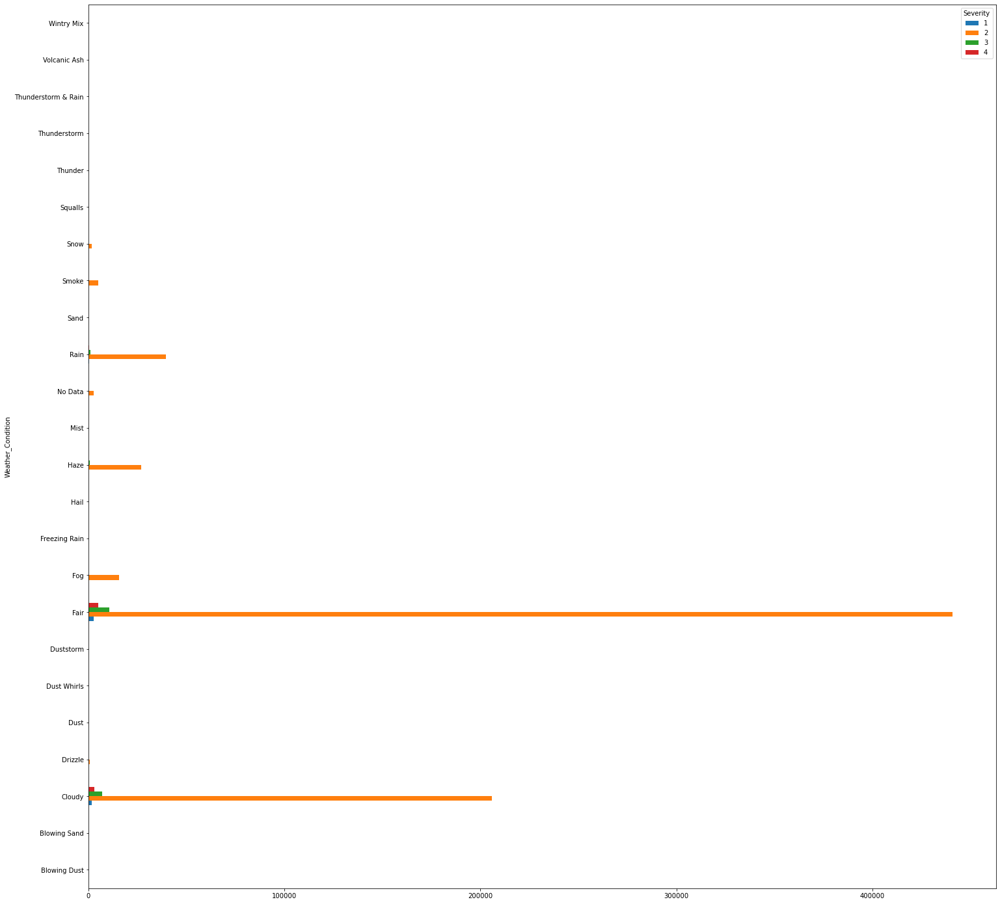

In [53]:
weather_con.pivot_table(index='Weather_Condition', columns='Severity', aggfunc='size').plot.barh(figsize=(25,25))

Most accidents occurred on days when the weather was "Fair" or 'Clear'. There are also relatively higher number of accidents on days with 'Fog' and 'Haze'. 

Proceeding on the same lines we can analyse/evaluate for a chosen county.

In [54]:
# Normalizing weather conditions countywise.
#First, we will check countywise weather condition details. This will help us choose a county for further analysis.
#Creating a subset
county_weather=New_df[['Weather_Condition','County']]



In [55]:
# Counting the total number of weather conditions for each county
temp2=county_weather.pivot_table(index='Weather_Condition', columns='County', aggfunc='size')
print(temp2)




County               Alameda  Alpine  Amador   Butte  Calaveras  Colusa  \
Weather_Condition                                                         
Blowing Dust             NaN     NaN     NaN     NaN        NaN     NaN   
Blowing Sand             NaN     NaN     NaN     NaN        NaN     NaN   
Cloudy               14963.0    58.0   493.0  1081.0      410.0   170.0   
Drizzle                 60.0     NaN     NaN     NaN        NaN     NaN   
Dust                     NaN     NaN     NaN     NaN        NaN     NaN   
Dust Whirls              NaN     NaN     NaN     NaN        NaN     NaN   
Duststorm                NaN     NaN     NaN     NaN        NaN     NaN   
Fair                 19369.0   103.0   779.0  2002.0     1151.0   624.0   
Fog                    364.0     3.0    24.0   101.0       59.0    23.0   
Freezing Rain            NaN     NaN     NaN     NaN        NaN     NaN   
Hail                     NaN     NaN     NaN     NaN        NaN     NaN   
Haze                   66

In [56]:
# converting the above pivot to dataframe
temp2_df = temp2.reset_index()
temp2_df




County,Weather_Condition,Alameda,Alpine,Amador,Butte,Calaveras,Colusa,Contra Costa,Del Norte,El Dorado,Fresno,Glenn,Humboldt,Imperial,Inyo,Kern,Kings,Lake,Lassen,Los Angeles,Madera,Marin,Mariposa,Mendocino,Merced,Modoc,Mono,Monterey,Napa,Nevada,Orange,Placer,Plumas,Riverside,Sacramento,San Benito,San Bernardino,San Diego,San Francisco,San Joaquin,San Luis Obispo,San Mateo,Santa Barbara,Santa Clara,Santa Cruz,Shasta,Sierra,Siskiyou,Solano,Sonoma,Stanislaus,Sutter,Tehama,Trinity,Tulare,Tuolumne,Ventura,Yolo,Yuba
0,Blowing Dust,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,2.0,NaN,34.0,1.0,NaN,NaN,35.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,3.0,NaN,62.0,NaN,NaN,NaN,3.0,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0,NaN,NaN,NaN,NaN,NaN,8.0,1.0,NaN
1,Blowing Sand,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Cloudy,14963.0,58.0,493.0,1081.0,410.0,170.0,4457.0,376.0,1535.0,6253.0,312.0,1554.0,31.0,163.0,3124.0,564.0,503.0,327.0,53016.0,996.0,1689.0,143.0,926.0,1150.0,140.0,164.0,2700.0,827.0,907.0,18958.0,2060.0,296.0,8336.0,11796.0,358.0,14938.0,18542.0,3785.0,2843.0,1063.0,5688.0,1714.0,12097.0,2268.0,840.0,43.0,679.0,1961.0,2788.0,1492.0,289.0,379.0,116.0,1130.0,518.0,2078.0,902.0,527.0
3,Drizzle,60.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,10.0,29.0,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,21.0,16.0,2.0,40.0,57.0,NaN,535.0,24.0,13.0,NaN,NaN,9.0,10.0,15.0,3.0,NaN,4.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0
4,Dust,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.0,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Dust Whirls,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Duststorm,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Fair,19369.0,103.0,779.0,2002.0,1151.0,624.0,12431.0,345.0,3193.0,6801.0,411.0,1364.0,95.0,620.0,12735.0,1373.0,1484.0,752.0,148143.0,2985.0,2656.0,489.0,2316.0,4032.0,193.0,618.0,4830.0,1883.0,1848.0,26328.0,4981.0,443.0,29629.0,30164.0,1245.0,27974.0,23065.0,2517.0,10850.0,3644.0,4709.0,3790.0,10974.0,3731.0,1802.0,95.0,1193.0,5283.0,4814.0,6433.0,1149.0,1289.0,153.0,5153.0,1467.0,6215.0,2754.0,1813.0
8,Fog,364.0,3.0,24.0,101.0,59.0,23.0,291.0,112.0,63.0,844.0,12.0,199.0,NaN,NaN,632.0,183.0,99.0,7.0,2599.0,284.0,258.0,36.0,37.0,394.0,6.0,5.0,224.0,140.0,315.0,553.0,396.0,16.0,566.0,1784.0,48.0,391.0,726.0,52.0,660.0,157.0,104.0,251.0,182.0,183.0,80.0,9.0,82.0,162.0,600.0,475.0,46.0,44.0,NaN,516.0,108.0,184.0,95.0,83.0
9,Freezing Rain,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [57]:
# checking for null values in each column. 
temp2_df.isnull().sum().sort_values()





County
Weather_Condition     0
San Bernardino        6
Los Angeles           6
Kern                  9
Riverside            10
San Diego            11
Sacramento           11
Placer               11
Nevada               11
Fresno               12
Orange               12
Santa Barbara        12
Solano               12
Ventura              13
El Dorado            14
San Luis Obispo      14
San Mateo            14
Yolo                 14
Santa Clara          14
Merced               14
Shasta               14
San Francisco        14
Alameda              14
Sonoma               14
Stanislaus           14
Siskiyou             14
Lassen               15
Kings                15
Napa                 15
Contra Costa         15
Tehama               15
Plumas               15
Tulare               15
San Joaquin          15
Santa Cruz           16
Sutter               16
Sierra               16
Butte                16
Madera               16
Lake                 16
Modoc                16
Mono     

San Bernandino and LA have relatively less null values meaning these are a counties with a diverse number of weather conditions in the state of California.

Text(0, 0.5, 'Total accidents from 2016 to 2021')

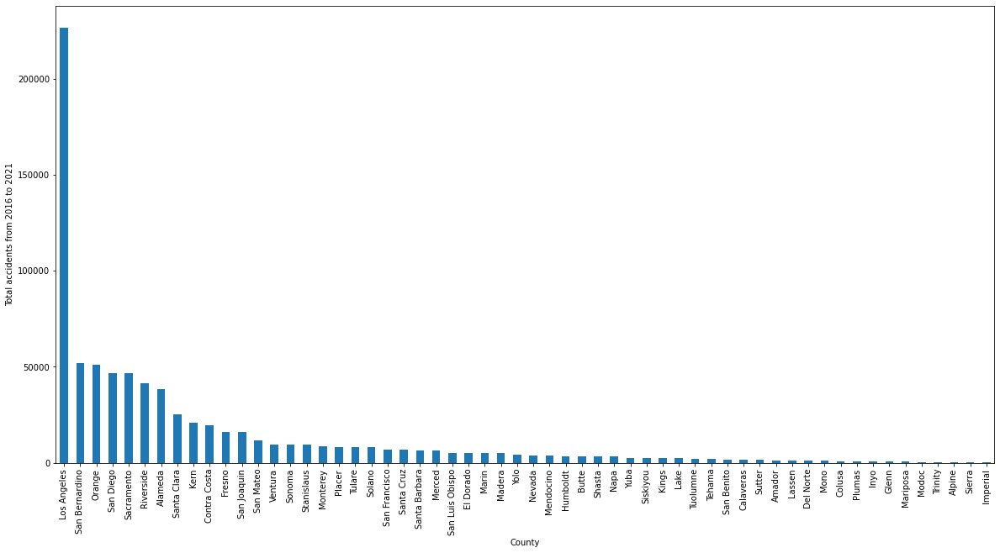

In [58]:
New_df['County'].value_counts().plot(kind='bar', figsize=(20,10))
plt.xlabel("County")
plt.ylabel("Total accidents from 2016 to 2021")

Since LA has more diversity in weather conditions and also is the highest in terms of number of accidents in CA, we can use LA county for further analysis.

In [59]:
# creating a new subset LA_weather with rows and columns for county LA only
LA_weather = New_df[(New_df['County'] == 'Los Angeles')]
LA_weather.head()




,Unnamed: 0,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Number,Street,Side,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Weather_Date,Weather_Time,Month&Year,StartDate,StartTime,EndDate,EndTime
5202,5233,A-5234,2,2016-03-22 19:14:41,2016-03-23 01:14:41,33.91133,-118.16819,33.91585,-118.18840,1.200,At I-710/Garfield Ave - Accident.,NaN,I-105 W,R,Paramount,Los Angeles,CA,90723,US,US/Pacific,KLGB,2016-03-22 18:53:00,63.0,NaN,58.0,30.00,10.0,West,12.7,NaN,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Day,Day,Day,2016-03-22,18:53:00,Mar 2016,2016-03-22,19:14:41,2016-03-23,01:14:41
5203,5234,A-5235,2,2016-03-22 19:43:16,2016-03-23 01:43:16,33.89238,-118.04408,33.89494,-118.04882,0.324,At Carmenita Rd/Exit 119 - Accident.,NaN,I-5 N,R,Santa Fe Springs,Los Angeles,CA,90670,US,US/Pacific,KFUL,2016-03-22 19:53:00,63.0,NaN,50.0,29.97,10.0,West,5.8,NaN,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Day,Day,2016-03-22,19:53:00,Mar 2016,2016-03-22,19:43:16,2016-03-23,01:43:16
5204,5235,A-5236,2,2016-03-22 19:36:44,2016-03-23 01:36:44,34.09256,-118.20622,34.09256,-118.20622,0.000,At Avenue 43 - Accident.,NaN,CA-110 N,R,Los Angeles,Los Angeles,CA,90031,US,US/Pacific,KCQT,2016-03-22 19:47:00,64.0,NaN,24.0,30.00,10.0,NNW,9.2,NaN,Fair,False,False,False,False,False,False,False,False,False,True,False,False,False,Night,Night,Day,Day,2016-03-22,19:47:00,Mar 2016,2016-03-22,19:36:44,2016-03-23,01:36:44
5205,5236,A-5237,2,2016-03-22 20:12:40,2016-03-23 02:12:40,33.91619,-118.23915,33.91619,-118.23903,0.007,At Wilmington Ave - Accident.,700.0,W El Segundo Blvd,L,Compton,Los Angeles,CA,90222,US,US/Pacific,KHHR,2016-03-22 19:53:00,62.1,NaN,56.0,30.02,10.0,WNW,5.8,NaN,Fair,False,False,False,False,False,False,False,False,False,False,False,True,False,Night,Night,Night,Day,2016-03-22,19:53:00,Mar 2016,2016-03-22,20:12:40,2016-03-23,02:12:40
5207,5238,A-5239,2,2016-03-22 20:59:43,2016-03-23 02:59:43,33.94819,-118.27973,33.94676,-118.27975,0.099,At Century Blvd - Accident.,NaN,I-110 S,R,Los Angeles,Los Angeles,CA,90003,US,US/Pacific,KHHR,2016-03-22 20:53:00,64.0,NaN,23.0,30.02,10.0,NNW,11.5,NaN,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,2016-03-22,20:53:00,Mar 2016,2016-03-22,20:59:43,2016-03-23,02:59:43


In [60]:
LA_weather.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 226618 entries, 5202 to 2776049
Data columns (total 55 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Unnamed: 0             226618 non-null  int64  
 1   ID                     226618 non-null  object 
 2   Severity               226618 non-null  int64  
 3   Start_Time             226618 non-null  object 
 4   End_Time               226618 non-null  object 
 5   Start_Lat              226618 non-null  float64
 6   Start_Lng              226618 non-null  float64
 7   End_Lat                226618 non-null  float64
 8   End_Lng                226618 non-null  float64
 9   Distance(mi)           226618 non-null  float64
 10  Description            226618 non-null  object 
 11  Number                 60499 non-null   float64
 12  Street                 226618 non-null  object 
 13  Side                   226618 non-null  object 
 14  City                   226616 no

In [61]:
# Lets create a calendar for LA - a month wise weather calendar. Pivoting the new dataframe LA_weather
LA_weather_temp=LA_weather.pivot_table(index='Weather_Date', columns='Weather_Condition', aggfunc='size')


In [62]:
# Converting the above pivot into a dataframe
LA_weather_df = LA_weather_temp.reset_index()
LA_weather_df

Weather_Condition,Weather_Date,Blowing Dust,Cloudy,Drizzle,Dust,Duststorm,Fair,Fog,Hail,Haze,Mist,No Data,Rain,Smoke,Snow,Thunder,Thunderstorm,Thunderstorm & Rain,Wintry Mix
0,2016-03-22,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-03-23,NaN,2.0,NaN,NaN,NaN,79.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-03-24,NaN,NaN,NaN,NaN,NaN,42.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-03-25,NaN,NaN,NaN,NaN,NaN,32.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-03-26,NaN,1.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2016-03-27,NaN,1.0,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2016-03-28,NaN,21.0,NaN,NaN,NaN,12.0,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN
7,2016-03-29,NaN,17.0,NaN,NaN,NaN,29.0,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN
8,2016-03-30,NaN,27.0,NaN,NaN,NaN,22.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2016-03-31,NaN,5.0,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In the above dataframe, we notice that every day we have two-three weather conditions. Now for every day in the chosen month, we would like to have a specific weather condition. For instance, 2016-03-23 can be 'Cloudy' and the next day could be 'Blowing Dust'. There are many ways to achieve this. However we are choosing to delete all those columns of weather conditions which do not occur in LA. 

In [63]:
# Analyzing data in LA_weather_df
LA_weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1984 entries, 0 to 1983
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Weather_Date         1984 non-null   object 
 1   Blowing Dust         6 non-null      float64
 2   Cloudy               1650 non-null   float64
 3   Drizzle              11 non-null     float64
 4   Dust                 2 non-null      float64
 5   Duststorm            1 non-null      float64
 6   Fair                 1883 non-null   float64
 7   Fog                  252 non-null    float64
 8   Hail                 1 non-null      float64
 9   Haze                 766 non-null    float64
 10  Mist                 32 non-null     float64
 11  No Data              84 non-null     float64
 12  Rain                 254 non-null    float64
 13  Smoke                67 non-null     float64
 14  Snow                 12 non-null     float64
 15  Thunder              6 non-null      f

In [64]:
LA_weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1984 entries, 0 to 1983
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Weather_Date         1984 non-null   object 
 1   Blowing Dust         6 non-null      float64
 2   Cloudy               1650 non-null   float64
 3   Drizzle              11 non-null     float64
 4   Dust                 2 non-null      float64
 5   Duststorm            1 non-null      float64
 6   Fair                 1883 non-null   float64
 7   Fog                  252 non-null    float64
 8   Hail                 1 non-null      float64
 9   Haze                 766 non-null    float64
 10  Mist                 32 non-null     float64
 11  No Data              84 non-null     float64
 12  Rain                 254 non-null    float64
 13  Smoke                67 non-null     float64
 14  Snow                 12 non-null     float64
 15  Thunder              6 non-null      f

In [65]:
# converting Weather_date column to datetime and setting it as index.
LA_weather_df['Weather_Date'] = pd.to_datetime(LA_weather_df['Weather_Date'])
LA_weather_df = LA_weather_df.set_index(['Weather_Date'])
LA_weather_df

Weather_Condition,Blowing Dust,Cloudy,Drizzle,Dust,Duststorm,Fair,Fog,Hail,Haze,Mist,No Data,Rain,Smoke,Snow,Thunder,Thunderstorm,Thunderstorm & Rain,Wintry Mix
Weather_Date,,,,,,,,,,,,,,,,,,
2016-03-22,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-23,NaN,2.0,NaN,NaN,NaN,79.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-24,NaN,NaN,NaN,NaN,NaN,42.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-25,NaN,NaN,NaN,NaN,NaN,32.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-26,NaN,1.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-27,NaN,1.0,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-28,NaN,21.0,NaN,NaN,NaN,12.0,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-29,NaN,17.0,NaN,NaN,NaN,29.0,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-30,NaN,27.0,NaN,NaN,NaN,22.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [66]:
# Selecting rows for LA for the month of May 2016
LA_weather_dfMay2016 = LA_weather_df.loc['2016-5-1':'2016-5-31']
LA_weather_dfMay2016

Weather_Condition,Blowing Dust,Cloudy,Drizzle,Dust,Duststorm,Fair,Fog,Hail,Haze,Mist,No Data,Rain,Smoke,Snow,Thunder,Thunderstorm,Thunderstorm & Rain,Wintry Mix
Weather_Date,,,,,,,,,,,,,,,,,,
2016-05-01,NaN,4.0,NaN,NaN,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-05-02,NaN,7.0,NaN,NaN,NaN,25.0,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-05-03,NaN,6.0,NaN,NaN,NaN,39.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-05-04,NaN,16.0,NaN,NaN,NaN,14.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-05-05,NaN,33.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
2016-05-06,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-05-08,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-05-09,NaN,25.0,NaN,NaN,NaN,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-05-10,NaN,18.0,NaN,NaN,NaN,18.0,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [67]:
# selecting column name with max value for each date/day in May 2016
result = LA_weather_dfMay2016.idxmax(axis=1)
print(result)

Weather_Date
2016-05-01      Fair
2016-05-02      Fair
2016-05-03      Fair
2016-05-04    Cloudy
2016-05-05    Cloudy
2016-05-06    Cloudy
2016-05-08    Cloudy
2016-05-09    Cloudy
2016-05-10    Cloudy
2016-05-11      Fair
2016-05-12      Fair
2016-05-16    Cloudy
2016-05-17    Cloudy
2016-05-18    Cloudy
2016-05-19    Cloudy
2016-05-20    Cloudy
2016-05-21    Cloudy
2016-05-22      Fair
2016-05-23    Cloudy
2016-05-24    Cloudy
2016-05-25    Cloudy
2016-05-26      Fair
2016-05-27      Fair
2016-05-28    Cloudy
2016-05-29    Cloudy
2016-05-30    Cloudy
2016-05-31    Cloudy
dtype: object


In [68]:
type(result)

pandas.core.series.Series

In [69]:
# converting the resultant series to a dataframe LA_calendar
LA_calendar = pd.DataFrame([result]).T
LA_calendar

,0
Weather_Date,
2016-05-01,Fair
2016-05-02,Fair
2016-05-03,Fair
2016-05-04,Cloudy
2016-05-05,Cloudy
2016-05-06,Cloudy
2016-05-08,Cloudy
2016-05-09,Cloudy
2016-05-10,Cloudy


In [70]:
LA_calendar.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 27 entries, 2016-05-01 to 2016-05-31
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       27 non-null     object
dtypes: object(1)
memory usage: 1.5+ KB


LA_calendar dataframe has an index of dates and only one column with weather condition. So we will rename the weather condition column as Day_Weather.

In [71]:
LA_calendar.rename(columns = {0:'Day_Weather'}, inplace = True)

In [72]:
LA_calendar.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 27 entries, 2016-05-01 to 2016-05-31
Data columns (total 1 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Day_Weather  27 non-null     object
dtypes: object(1)
memory usage: 1.5+ KB


In [73]:
#selecting rows from LA_weather for accident data in May 2016 after converting Weather_Date to datetime and setting it as index.
LA_weather['Weather_Date'] = pd.to_datetime(LA_weather['Weather_Date'])
LA_weather = LA_weather.set_index(['Weather_Date'])
LA_weather


C:\Users\Shweta\AppData\Local\Temp\ipykernel_20848\1795781094.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LA_weather['Weather_Date'] = pd.to_datetime(LA_weather['Weather_Date'])


In [74]:
LA_weather.head()

,Unnamed: 0,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Number,Street,Side,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Weather_Time,Month&Year,StartDate,StartTime,EndDate,EndTime
Weather_Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-03-22,5233,A-5234,2,2016-03-22 19:14:41,2016-03-23 01:14:41,33.91133,-118.16819,33.91585,-118.18840,1.200,At I-710/Garfield Ave - Accident.,NaN,I-105 W,R,Paramount,Los Angeles,CA,90723,US,US/Pacific,KLGB,2016-03-22 18:53:00,63.0,NaN,58.0,30.00,10.0,West,12.7,NaN,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Day,Day,Day,18:53:00,Mar 2016,2016-03-22,19:14:41,2016-03-23,01:14:41
2016-03-22,5234,A-5235,2,2016-03-22 19:43:16,2016-03-23 01:43:16,33.89238,-118.04408,33.89494,-118.04882,0.324,At Carmenita Rd/Exit 119 - Accident.,NaN,I-5 N,R,Santa Fe Springs,Los Angeles,CA,90670,US,US/Pacific,KFUL,2016-03-22 19:53:00,63.0,NaN,50.0,29.97,10.0,West,5.8,NaN,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Day,Day,19:53:00,Mar 2016,2016-03-22,19:43:16,2016-03-23,01:43:16
2016-03-22,5235,A-5236,2,2016-03-22 19:36:44,2016-03-23 01:36:44,34.09256,-118.20622,34.09256,-118.20622,0.000,At Avenue 43 - Accident.,NaN,CA-110 N,R,Los Angeles,Los Angeles,CA,90031,US,US/Pacific,KCQT,2016-03-22 19:47:00,64.0,NaN,24.0,30.00,10.0,NNW,9.2,NaN,Fair,False,False,False,False,False,False,False,False,False,True,False,False,False,Night,Night,Day,Day,19:47:00,Mar 2016,2016-03-22,19:36:44,2016-03-23,01:36:44
2016-03-22,5236,A-5237,2,2016-03-22 20:12:40,2016-03-23 02:12:40,33.91619,-118.23915,33.91619,-118.23903,0.007,At Wilmington Ave - Accident.,700.0,W El Segundo Blvd,L,Compton,Los Angeles,CA,90222,US,US/Pacific,KHHR,2016-03-22 19:53:00,62.1,NaN,56.0,30.02,10.0,WNW,5.8,NaN,Fair,False,False,False,False,False,False,False,False,False,False,False,True,False,Night,Night,Night,Day,19:53:00,Mar 2016,2016-03-22,20:12:40,2016-03-23,02:12:40
2016-03-22,5238,A-5239,2,2016-03-22 20:59:43,2016-03-23 02:59:43,33.94819,-118.27973,33.94676,-118.27975,0.099,At Century Blvd - Accident.,NaN,I-110 S,R,Los Angeles,Los Angeles,CA,90003,US,US/Pacific,KHHR,2016-03-22 20:53:00,64.0,NaN,23.0,30.02,10.0,NNW,11.5,NaN,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,20:53:00,Mar 2016,2016-03-22,20:59:43,2016-03-23,02:59:43


In [75]:
LA_accidents_may2016=LA_weather.loc['2016-5-1':'2016-5-31']

In [76]:
LA_accidents_may2016.head(100)

,Unnamed: 0,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Number,Street,Side,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Weather_Time,Month&Year,StartDate,StartTime,EndDate,EndTime
Weather_Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-05-01,7535,A-7536,2,2016-05-01 03:14:54,2016-05-01 09:14:54,34.161320,-118.293150,34.166340,-118.298730,0.471,At Western Ave - Accident.,518.0,Sonora Ave,R,Glendale,Los Angeles,CA,91201-2736,US,US/Pacific,KBUR,2016-05-01 02:53:00,55.0,NaN,69.0,29.81,10.0,Calm,NaN,NaN,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,02:53:00,May 2016,2016-05-01,03:14:54,2016-05-01,09:14:54
2016-05-01,7536,A-7537,2,2016-05-01 03:26:31,2016-05-01 09:26:31,34.054897,-118.257199,34.054898,-118.257198,0.000,At 5th St/6th St - Accident.,NaN,W 4th St,R,Los Angeles,Los Angeles,CA,90017,US,US/Pacific,KCQT,2016-05-01 03:47:00,59.0,NaN,78.0,29.84,10.0,East,3.5,NaN,Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night,03:47:00,May 2016,2016-05-01,03:26:31,2016-05-01,09:26:31
2016-05-01,7537,A-7538,3,2016-05-01 03:22:47,2016-05-01 09:22:47,33.885960,-118.190000,33.901790,-118.186270,1.114,Between Alondra Blvd and Rosecrans Ave - Accid...,NaN,Long Beach Fwy N,R,Compton,Los Angeles,CA,90221,US,US/Pacific,KLGB,2016-05-01 03:05:00,60.1,NaN,80.0,29.84,10.0,East,4.6,NaN,Cloudy,False,False,False,False,True,False,False,False,False,False,False,False,False,Night,Night,Night,Night,03:05:00,May 2016,2016-05-01,03:22:47,2016-05-01,09:22:47
2016-05-01,7540,A-7541,3,2016-05-01 07:02:47,2016-05-01 13:02:47,34.023240,-117.811590,34.025072,-117.807389,0.272,Between Diamond Bar Blvd and Phillips Ranch Rd...,130.0,N Diamond Bar Blvd,R,Diamond Bar,Los Angeles,CA,91765,US,US/Pacific,KPOC,2016-05-01 07:47:00,55.4,NaN,82.0,29.93,10.0,North,NaN,NaN,Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,07:47:00,May 2016,2016-05-01,07:02:47,2016-05-01,13:02:47
2016-05-01,7541,A-7542,2,2016-05-01 13:02:13,2016-05-01 19:02:13,34.014510,-117.819370,34.006930,-117.827090,0.685,At Grand Ave - Accident.,NaN,CA-60 W,R,Diamond Bar,Los Angeles,CA,91765,US,US/Pacific,KPOC,2016-05-01 12:47:00,68.0,NaN,49.0,29.94,10.0,SW,6.9,NaN,Fair,False,False,False,False,True,False,False,False,False,False,False,False,False,Day,Day,Day,Day,12:47:00,May 2016,2016-05-01,13:02:13,2016-05-01,19:02:13
2016-05-01,7542,A-7543,2,2016-05-01 12:59:53,2016-05-01 18:59:53,34.028640,-118.216110,34.027720,-118.212130,0.237,At CA-60 - Accident.,NaN,I-5 S,R,Los Angeles,Los Angeles,CA,90023,US,US/Pacific,KCQT,2016-05-01 12:47:00,71.1,NaN,55.0,29.91,10.0,Calm,NaN,NaN,Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,12:47:00,May 2016,2016-05-01,12:59:53,2016-05-01,18:59:53
2016-05-01,7543,A-7544,2,2016-05-01 12:59:53,2016-05-01 18:59:53,33.937653,-118.094172,33.944670,-118.098820,0.553,At I-605 - Accident.,NaN,I-5 N,R,Downey,Los Angeles,CA,90241,US,US/Pacific,KLGB,2016-05-01 12:53:00,66.0,NaN,59.0,29.93,10.0,SSE,9.2,NaN,Fair,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,12:53:00,May 2016,2016-05-01,12:59:53,2016-05-01,18:59:53
2016-05-01,7544,A-7545,3,2016-05-01 14:45:00,2016-05-01 20:45:00,33.898860,-118.370220,33.921480,-118.369000,1.564,Between Rosecrans Ave/Hindry Ave/Exit 43 and E...,NaN,I-405 N,R,Hawthorne,Los Angeles,CA,90250,US,US/Pacific,KHHR,2016-05-01 14:53:00,70.0,NaN,47.0,29.92,10.0,SSW,5.8,NaN,Fair,False,False,Fa

In [77]:
#joining(left join) both columns by Index

LA_May_2016=LA_accidents_may2016.join(LA_calendar, lsuffix="_left", rsuffix="_right", how='left')

In [78]:
LA_May_2016.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1635 entries, 2016-05-01 to 2016-05-31
Data columns (total 55 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             1635 non-null   int64  
 1   ID                     1635 non-null   object 
 2   Severity               1635 non-null   int64  
 3   Start_Time             1635 non-null   object 
 4   End_Time               1635 non-null   object 
 5   Start_Lat              1635 non-null   float64
 6   Start_Lng              1635 non-null   float64
 7   End_Lat                1635 non-null   float64
 8   End_Lng                1635 non-null   float64
 9   Distance(mi)           1635 non-null   float64
 10  Description            1635 non-null   object 
 11  Number                 251 non-null    float64
 12  Street                 1635 non-null   object 
 13  Side                   1635 non-null   object 
 14  City                   1635 non-null  

In [79]:
LA_May_2016['StartDate'] = pd.to_datetime(LA_May_2016['StartDate'])

LA_May_2016 contains all the accidents in LA in the May 2016. Every day has a unique weather. We will analyse this dataframe. We first start by analysing the number of accidents per day. 

<AxesSubplot:xlabel='StartDate'>

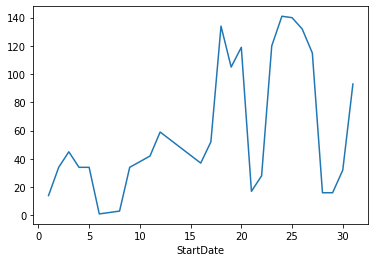

In [80]:
LA_May_2016.groupby(LA_May_2016['StartDate'].dt.day).count().StartDate.plot()

We see accidents peaking after the mid of the month. Next lets check day /night and weather Vs number of accidents.

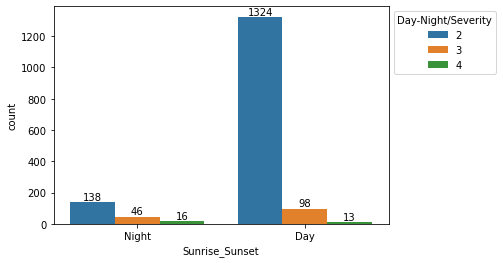

In [81]:
# plot and add annotations
p = sns.countplot(data=LA_May_2016, x='Sunrise_Sunset', hue='Severity')
p.legend(title='Day-Night/Severity', bbox_to_anchor=(1, 1), loc='upper left')

for c in p.containers:
    # set the bar label
    p.bar_label(c, fmt='%.0f', label_type='edge')

Higher accidents are recorded during the day than in the night. This could also be possible that the traffic during day is higher than the traffic during night.

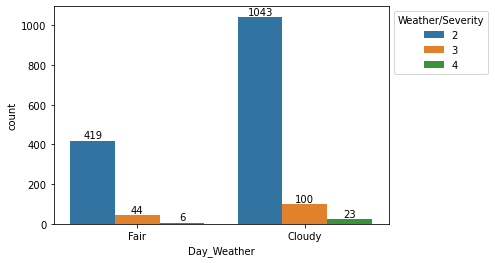

In [82]:
# plot and add annotations
p = sns.countplot(data=LA_May_2016, x='Day_Weather', hue='Severity')
p.legend(title='Weather/Severity', bbox_to_anchor=(1, 1), loc='upper left')

for c in p.containers:
    # set the bar label
    p.bar_label(c, fmt='%.0f', label_type='edge')

We clearly see a higher number of accidents on a cloudy day which indicates environment factors affecting accidents.

Text(0, 0.5, 'Weather days in May2016')

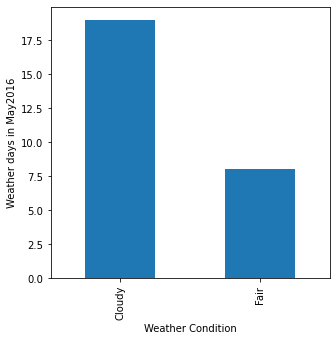

In [83]:
LA_calendar['Day_Weather'].value_counts().plot(kind='bar', figsize=(5,5))
plt.xlabel("Weather Condition")
plt.ylabel("Weather days in May2016")

May 2016 in LA shows more number of cloudy days and this could be why we have more total accidents under cloudy days

Lets try doing for LA_weather which has all accidents from 2016 to 2021 instead of just May 2016. So first create a calendar for one year.

In [84]:
# Selecting rows for LA for the year of 2016
LA_weather_2016 = LA_weather_df.loc['2016-3-22':'2016-12-31']
LA_weather_2016

Weather_Condition,Blowing Dust,Cloudy,Drizzle,Dust,Duststorm,Fair,Fog,Hail,Haze,Mist,No Data,Rain,Smoke,Snow,Thunder,Thunderstorm,Thunderstorm & Rain,Wintry Mix
Weather_Date,,,,,,,,,,,,,,,,,,
2016-03-22,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-23,NaN,2.0,NaN,NaN,NaN,79.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-24,NaN,NaN,NaN,NaN,NaN,42.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-25,NaN,NaN,NaN,NaN,NaN,32.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-26,NaN,1.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-27,NaN,1.0,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-28,NaN,21.0,NaN,NaN,NaN,12.0,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-29,NaN,17.0,NaN,NaN,NaN,29.0,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN
2016-03-30,NaN,27.0,NaN,NaN,NaN,22.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [85]:
# selecting column name with max value for each date/day in May 2016
year = LA_weather_2016.idxmax(axis=1)

# converting the resultant series- year to a dataframe LA_calendar_2016
LA_calendar_2016 = pd.DataFrame([year]).T


In [86]:
LA_calendar_2016.rename(columns = {0:'Day_Weather'}, inplace = True)

In [87]:
LA_accidents_2016=LA_weather.loc['2016-3-22':'2016-12-31']

In [88]:
#joining(left join) both columns by Index

LA_2016=LA_accidents_2016.join(LA_calendar_2016, lsuffix="_left", rsuffix="_right", how='left')

In [89]:
LA_2016['StartDate'] = pd.to_datetime(LA_2016['StartDate'])

In [90]:
LA_2016.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 11130 entries, 2016-03-22 to 2016-12-31
Data columns (total 55 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Unnamed: 0             11130 non-null  int64         
 1   ID                     11130 non-null  object        
 2   Severity               11130 non-null  int64         
 3   Start_Time             11130 non-null  object        
 4   End_Time               11130 non-null  object        
 5   Start_Lat              11130 non-null  float64       
 6   Start_Lng              11130 non-null  float64       
 7   End_Lat                11130 non-null  float64       
 8   End_Lng                11130 non-null  float64       
 9   Distance(mi)           11130 non-null  float64       
 10  Description            11130 non-null  object        
 11  Number                 1135 non-null   float64       
 12  Street                 11130 non-null  obje

<AxesSubplot:xlabel='StartDate'>

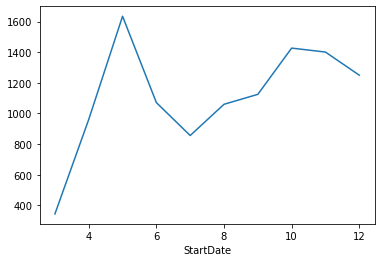

In [91]:
LA_2016.groupby(LA_2016['StartDate'].dt.month).count().StartDate.plot()

Apparently, we see accidents peaking in the month of May in LA county. This could be because of higher number of cloudy days in May.

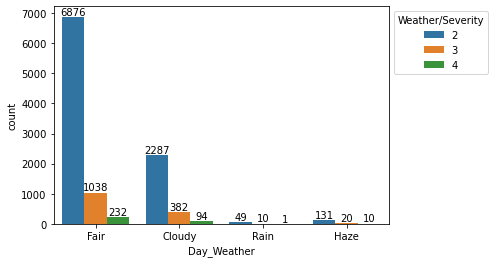

In [92]:
# plot and add annotations
p = sns.countplot(data=LA_2016, x='Day_Weather', hue='Severity')
p.legend(title='Weather/Severity', bbox_to_anchor=(1, 1), loc='upper left')

for c in p.containers:
    # set the bar label
    p.bar_label(c, fmt='%.0f', label_type='edge')

Since the number of accidents are now higher on Fair weather days, lets take a  count of number of Fair weather days overall in LA county in 2016. For this we use LA_calendar_2016

In [93]:
LA_calendar_2016

,Day_Weather
Weather_Date,
2016-03-22,Fair
2016-03-23,Fair
2016-03-24,Fair
2016-03-25,Fair
2016-03-26,Fair
2016-03-27,Fair
2016-03-28,Cloudy
2016-03-29,Fair
2016-03-30,Cloudy


Text(0, 0.5, 'Weather days in 2016')

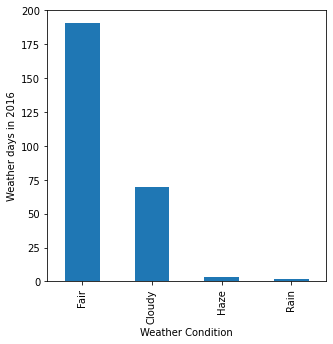

In [94]:
LA_calendar_2016['Day_Weather'].value_counts().plot(kind='bar', figsize=(5,5))
plt.xlabel("Weather Condition")
plt.ylabel("Weather days in 2016")

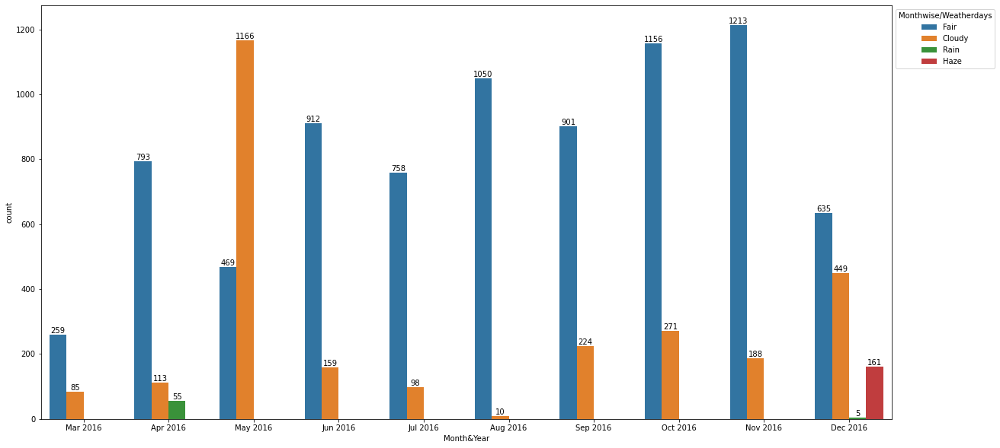

In [95]:
# plot and add annotations
plt.figure(figsize=(20, 10)) 
p = sns.countplot(data=LA_2016, x='Month&Year', hue='Day_Weather')
p.legend(title='Monthwise/Weatherdays', bbox_to_anchor=(1, 1), loc='upper left')

for c in p.containers:
    # set the bar label
    p.bar_label(c, fmt='%.0f', label_type='edge')

Except for May 2016, every other month has higher number of Fair weather days. However earlier we did see that May 2016 had recorded a peak in accidents, which again indicates to a relation between weather and accidents.

Now, just like we did for a a Month- May 2016 and an year-2016, we can apply the same to a period- 2016-2021 to analyse year wise trends

In [96]:
LA_weather_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1984 entries, 2016-03-22 to 2021-12-31
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Blowing Dust         6 non-null      float64
 1   Cloudy               1650 non-null   float64
 2   Drizzle              11 non-null     float64
 3   Dust                 2 non-null      float64
 4   Duststorm            1 non-null      float64
 5   Fair                 1883 non-null   float64
 6   Fog                  252 non-null    float64
 7   Hail                 1 non-null      float64
 8   Haze                 766 non-null    float64
 9   Mist                 32 non-null     float64
 10  No Data              84 non-null     float64
 11  Rain                 254 non-null    float64
 12  Smoke                67 non-null     float64
 13  Snow                 12 non-null     float64
 14  Thunder              6 non-null      float64
 15  Thunderstorm        

In [97]:
# selecting column name with max value for each date/day in May 2016
series_2016_2021 = LA_weather_df.idxmax(axis=1)

# converting the resultant series- year to a dataframe LA_calendar_2016
LA_calendar_2016_2021 = pd.DataFrame([series_2016_2021]).T


In [98]:
LA_calendar_2016_2021.rename(columns = {0:'Day_Weather'}, inplace = True)

In [99]:
LA_accidents_2016_2021=LA_weather.loc['2016-3-22':'2021-12-31']

In [100]:
#joining(left join) both columns by Index

LA_2016_2021=LA_accidents_2016_2021.join(LA_calendar_2016_2021, lsuffix="_left", rsuffix="_right", how='left')

In [101]:
LA_2016_2021['StartDate'] = pd.to_datetime(LA_2016_2021['StartDate'])

In [102]:
LA_2016_2021.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 226618 entries, 2016-03-22 to 2021-12-31
Data columns (total 55 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   Unnamed: 0             226618 non-null  int64         
 1   ID                     226618 non-null  object        
 2   Severity               226618 non-null  int64         
 3   Start_Time             226618 non-null  object        
 4   End_Time               226618 non-null  object        
 5   Start_Lat              226618 non-null  float64       
 6   Start_Lng              226618 non-null  float64       
 7   End_Lat                226618 non-null  float64       
 8   End_Lng                226618 non-null  float64       
 9   Distance(mi)           226618 non-null  float64       
 10  Description            226618 non-null  object        
 11  Number                 60499 non-null   float64       
 12  Street                 22661

<AxesSubplot:xlabel='StartDate'>

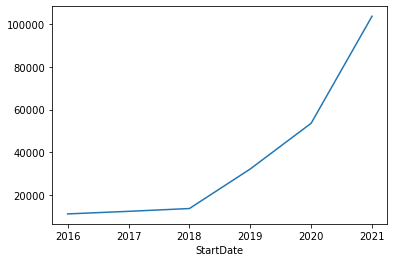

In [103]:
LA_2016_2021.groupby(LA_2016_2021['StartDate'].dt.year).count().StartDate.plot()

There is a clear hike in the number of accidents in 2019, 2020 and 2021. Could these be connected to Covid?, which brings us to our third hypothesis

In [104]:
LA_2016_2021['StartDate']= pd.to_datetime(LA_2016_2021['StartDate'],format='%Y-%m-%d')
LA_2016_2021['Year']= LA_2016_2021['StartDate'].dt.year
LA_2016_2021['Month']= LA_2016_2021['StartDate'].dt.month


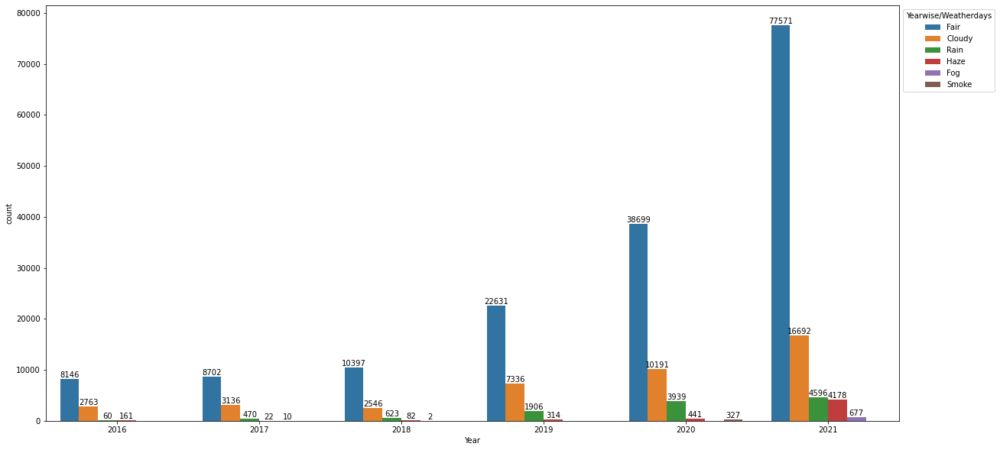

In [107]:
# plot and add annotations
plt.figure(figsize=(20, 10)) 
p = sns.countplot(data=LA_2016_2021, x='Year', hue='Day_Weather')
p.legend(title='Yearwise/Weatherdays', bbox_to_anchor=(1, 1), loc='upper left')

for c in p.containers:
    # set the bar label
    p.bar_label(c, fmt='%.0f', label_type='edge')

Text(0, 0.5, 'Weather days in 2016-2021')

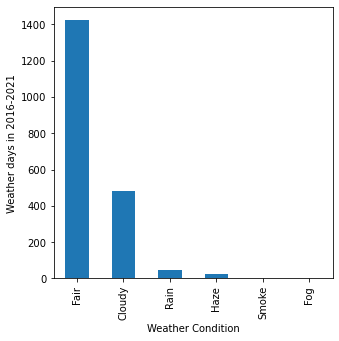

In [108]:
LA_calendar_2016_2021['Day_Weather'].value_counts().plot(kind='bar', figsize=(5,5))
plt.xlabel("Weather Condition")
plt.ylabel("Weather days in 2016-2021")

Text(0, 0.5, 'Total accidents from 2016 to 2021')

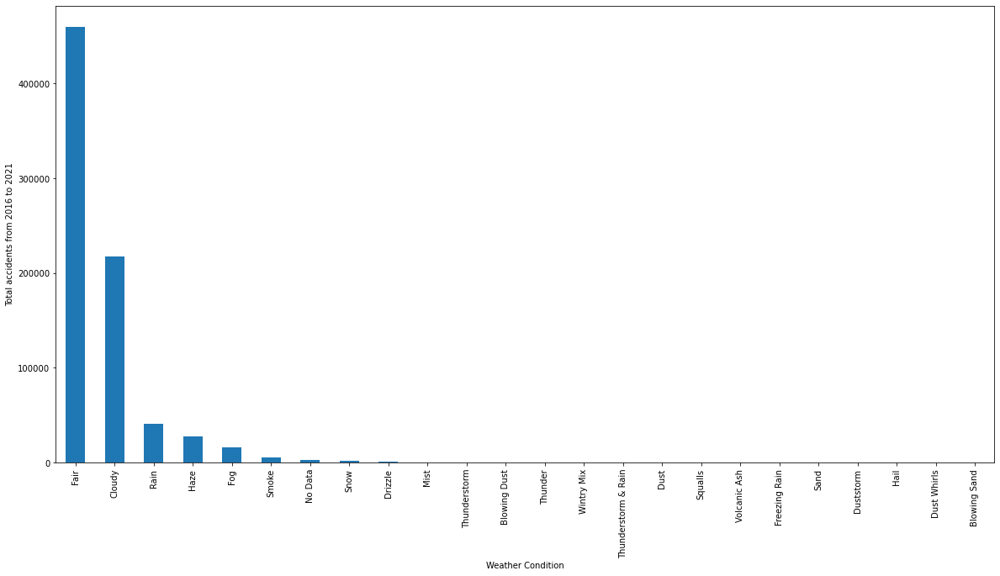

In [109]:
New_df['Weather_Condition'].value_counts().plot(kind='bar', figsize=(20,10))
plt.xlabel("Weather Condition")
plt.ylabel("Total accidents from 2016 to 2021")

Lets analyse how accident severity changes with other different external factors. We could categorise the external factors as environmental factors and traffic management features.
Starting with day and night.

In [111]:
Daynight_severity=df[['Sunrise_Sunset','Severity']]

<AxesSubplot:ylabel='Severity'>

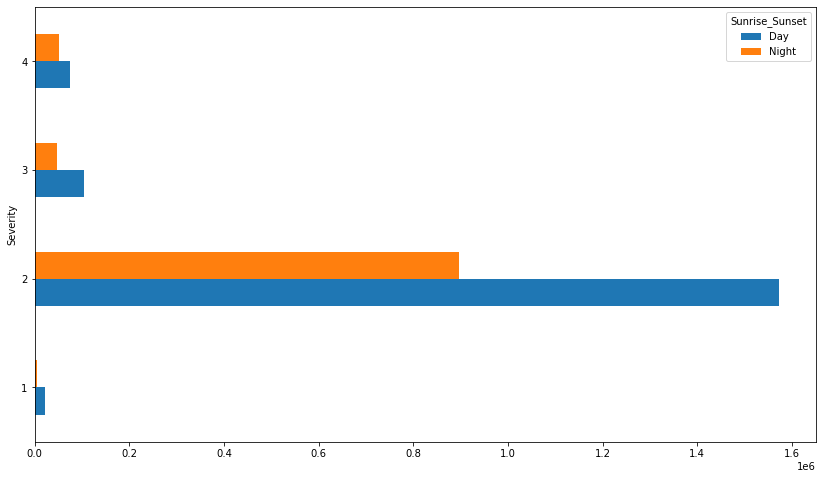

In [112]:
Daynight_severity.pivot_table(index='Severity', columns='Sunrise_Sunset', aggfunc='size').plot.barh(figsize=(14,8))

In contrast to popular notion that night driving could be dangerous, we notice that most accidents have occurred during the day

In [114]:
#Analysing wind speed and severity
Windspeed_severity=df[['Wind_Speed(mph)','Severity']]

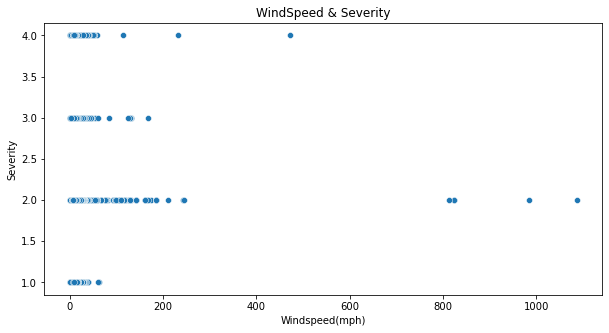

In [115]:
plt.figure(figsize=(10,5))
plt.title('WindSpeed & Severity')
plt.xlabel('Windspeed(mph)')
plt.ylabel('Severity')
sns.scatterplot(x=Windspeed_severity['Wind_Speed(mph)'],y=Windspeed_severity['Severity'])
plt.show()

Accidents with severity two show higher wind speed, however these could also be outliers.

In [116]:
df[df['Wind_Speed(mph)'] >= 200.00]

,Unnamed: 0,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Number,Street,Side,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Weather_Date,Weather_Time,Month&Year,StartDate,StartTime,EndDate,EndTime
11322,11454,A-11455,2,2016-06-13 15:58:19,2016-06-13 21:58:19,34.234870,-118.412160,34.232059,-118.407485,0.330,At CA-170 - Accident.,NaN,Golden State Fwy S,R,Pacoima,Los Angeles,CA,91331,US,US/Pacific,KWHP,2016-06-13 16:53:00,71.6,NaN,53.0,30.06,10.0,SE,822.8,NaN,Clear,False,False,False,False,True,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2016-06-13,16:53:00,Jun 2016,2016-06-13,15:58:19,2016-06-13,21:58:19
11331,11463,A-11464,2,2016-06-13 17:11:24,2016-06-13 23:11:24,34.246890,-118.424900,34.242600,-118.420370,0.393,At Osborne St/Exit 154 - Accident.,NaN,Golden State Fwy S,R,Pacoima,Los Angeles,CA,91331,US,US/Pacific,KWHP,2016-06-13 16:53:00,71.6,NaN,53.0,30.06,10.0,SE,822.8,NaN,Clear,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2016-06-13,16:53:00,Jun 2016,2016-06-13,17:11:24,2016-06-13,23:11:24
154085,157532,A-157533,4,2017-03-15 15:29:47,2017-03-15 21:29:47,26.935065,-80.160099,26.935065,-80.160099,0.000,Closed at Cortona Blvd - Road closed due to ac...,7999.0,W Indiantown Rd,R,Jupiter,Palm Beach,FL,33478,US,US/Eastern,KSUA,2017-03-15 14:47:00,62.6,NaN,45.0,30.19,7.0,NNW,471.8,NaN,Scattered Clouds,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2017-03-15,14:47:00,Mar 2017,2017-03-15,15:29:47,2017-03-15,21:29:47
695484,710258,A-710259,2,2021-07-12 17:44:46,2021-07-12 20:04:38,32.958287,-96.913703,32.960179,-96.914805,0.146,Incident on I-35E NB near NORTHSIDE DR Drive w...,NaN,I-35E N,R,Carrollton,Dallas,TX,75006,US,US/Central,KADS,2021-07-12 17:47:00,84.0,84.0,55.0,29.36,10.0,SSW,812.0,0.0,Fair / Windy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2021-07-12,17:47:00,Jul 2021,2021-07-12,17:44:46,2021-07-12,20:04:38
1385254,1414359,A-1414360,2,2021-09-16 13:46:00,2021-09-16 15:52:45,37.488323,-122.209264,37.489033,-122.212834,0.202,Accident on Woodside Rd exit [408] from Woodsi...,NaN,CA-84,R,Redwood City,San Mateo,CA,94063,US,US/Pacific,KSQL,2021-09-16 13:47:00,66.0,66.0,73.0,29.84,10.0,NNE,243.0,0.0,Fair / Windy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2021-09-16,13:47:00,Sep 2021,2021-09-16,13:46:00,2021-09-16,15:52:45
1455920,1486460,A-1486461,2,2021-12-16 12:31:00,2021-12-16 14:44:36,37.328360,-120.559242,37.328225,-120.558982,0.017,Accident from N Gurr Rd to Ashby Rd.,4001.0,Ashby Rd,L,Atwater,Merced,CA,95301-5406,US,US/Pacific,KMER,2021-12-16 12:45:00,50.0,50.0,100.0,29.91,10.0,S,1087.0,0.0,Cloudy / Windy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2021-12-16,12:45:00,Dec 2021,2021-12-16,12:31:00,2021-12-16,14:44:36
1910187,1955910,A-1955911,2,2020-09-28 15:55:47,2020-09-28 17:57:42,32.918276,-96.833859,32.918790,-96.833988,0.036,Incident on CRESTLINE AVE near RICKOVER DR Exp...,12384.0,Crestline Ave,R,Dallas,Dallas,TX,75244,US,US/Central,KADS,2020-09-28 15:47:00,75.0,75.0,24.0,29.41,10.0,N,211.0,0.0,Fair / Windy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day,2020-09-28,15:47:00,Sep 2020,2020-09-28,15:55:47,2020-09-28,17:57:42
2053479,2104007,A-2104008,4,2020-05-07 15:26:53,2020-05-07 16:01:51,32.682690,-97.240410,32.682690,-97.240410,0.000,At Martin St/Exit 33 - Accident. Hard shoulder...,NaN,E Loop 820,R,Fort Worth,T

A wind gust of 231 mph was measured on the Mount Washington Observatory on April 12, 1934. It remained the highest-ever anemometer-measured wind gust on Earth until an even higher gust was observed on Barrow Island, Australia, in 1996. 
On February 9, 2020, an anemometer at an elevation of 9186 feet on Mt. Kirkwood in the California Sierra reported a wind gust of 209 mph. This wind gust was the highest on record for the state of California and potentially the fourth highest gust measured by an anemometer at any site on Earth. So clearly, we have quite a few outliers in windspeed as indicated in the selection above.

In [117]:
#Analysing visibility and severity
Visi_severity=df[['Visibility(mi)','Severity']]

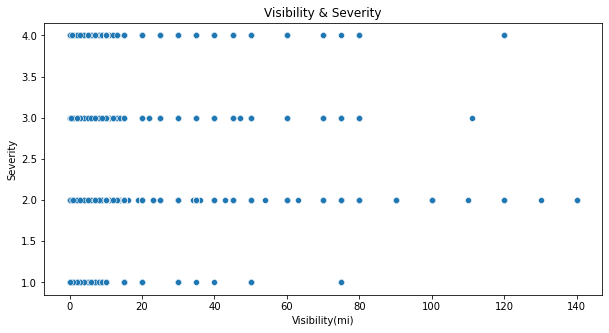

In [118]:
plt.figure(figsize=(10,5))
plt.title('Visibility & Severity')
plt.xlabel('Visibility(mi)')
plt.ylabel('Severity')
sns.scatterplot(x=Visi_severity['Visibility(mi)'],y=Visi_severity['Severity'])
plt.show()

Lower visbility area is packed with higher scatter points indicating low visibility during most accidents. There could be a cause and effect relationship here. This is not uncommon and can be connected to the weather conditions at that time.

Let us create a subset containing all environmental factors and severity.

In [119]:
env_factors=df[['Severity','Sunrise_Sunset','Visibility(mi)','Temperature(F)','Wind_Chill(F)','Wind_Speed(mph)','Weather_Condition','Humidity(%)','Pressure(in)','Wind_Direction','Precipitation(in)']]
env_factors.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2776051 entries, 0 to 2776050
Data columns (total 11 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Severity           int64  
 1   Sunrise_Sunset     object 
 2   Visibility(mi)     float64
 3   Temperature(F)     float64
 4   Wind_Chill(F)      float64
 5   Wind_Speed(mph)    float64
 6   Weather_Condition  object 
 7   Humidity(%)        float64
 8   Pressure(in)       float64
 9   Wind_Direction     object 
 10  Precipitation(in)  float64
dtypes: float64(7), int64(1), object(3)
memory usage: 233.0+ MB


In [120]:
pd.options.display.float_format = '{:.2f}'.format
env_factors.describe()

,Severity,Visibility(mi),Temperature(F),Wind_Chill(F),Wind_Speed(mph),Humidity(%),Pressure(in),Precipitation(in)
count,2776051.00,2763696.00,2776051.00,2375687.00,2678267.00,2772239.00,2773261.00,2282814.00
mean,2.14,9.10,61.79,59.66,7.40,64.37,29.47,0.01
std,0.48,2.70,18.62,21.16,5.51,22.87,1.04,0.09
min,1.00,0.00,-33.00,-59.00,0.00,1.00,0.02,0.00
25%,2.00,10.00,50.00,46.00,3.50,48.00,29.31,0.00
50%,2.00,10.00,64.00,63.00,7.00,67.00,29.82,0.00
75%,2.00,10.00,76.00,76.00,10.00,83.00,30.01,0.00
max,4.00,140.00,120.00,120.00,1087.00,100.00,58.90,24.00


Visbilty max value could be an outlier. Column precipitation does not have a lot of values and hence can be deleted in the main dataframe. We have already identified wind speed outliers.

<AxesSubplot:>

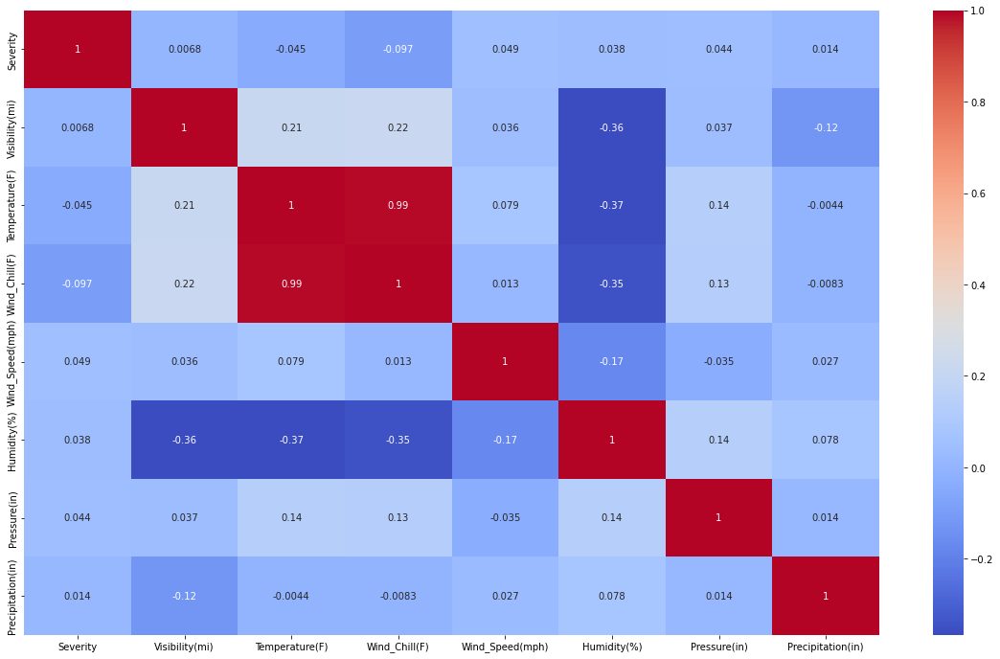

In [121]:
fig, ax = plt.subplots(figsize=(20,12))
sns.heatmap(env_factors.corr(), annot=True, ax=ax, cmap= 'coolwarm')

We dont notice significantly high correlation, but variables like Visibility, Temperature and Wind_Chill definately show some correlation to Humidity. Wind_chill and Temperature columns give similar information, So we could proceed with either one of them. Retaining Wind_Chill is a better idea because it gives the actual temperature cahnges due to wind conditions. 

We can also subset a dataframe containing all the boolean variables pertaining to traffic management features.

In [122]:
Bool_severity=df[['Amenity','Bump','Crossing','Give_Way','Junction','No_Exit','Railway','Roundabout','Station','Stop','Traffic_Calming','Traffic_Signal','Turning_Loop','Severity']]


<AxesSubplot:>

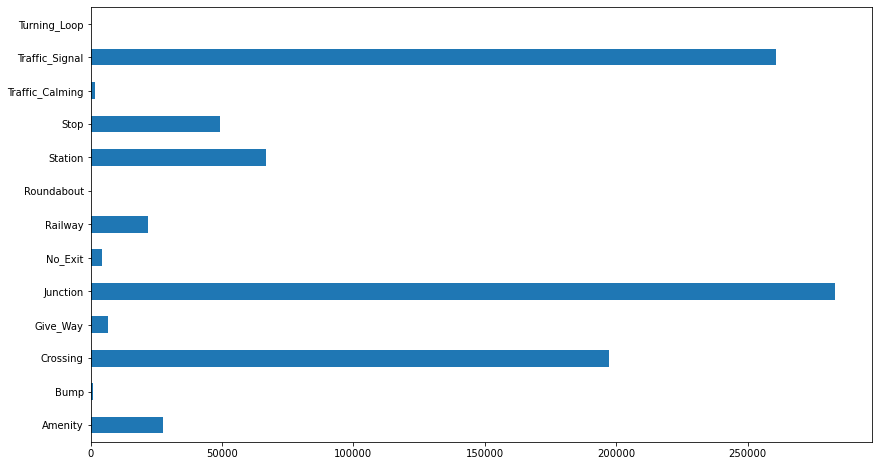

In [123]:
(Bool_severity[['Amenity','Bump','Crossing','Give_Way','Junction','No_Exit','Railway','Roundabout','Station','Stop','Traffic_Calming','Traffic_Signal','Turning_Loop']] == True).sum().plot.barh(figsize=(14,8))

These above boolean variables indicate that Junctions, Traffic Signals, Crossings have most number of accidents. Turning loop, Bump, and Roundabout have extremely low number of accidents. 

In [124]:
# save the data to a new csv file
datapath = 'C:\\Users\\Shweta\\Documents\\gitrepo\\Capstonetwo\\'
LA_2016_2021.to_csv(datapath+'USaccidentsdata_cleanednexplored.csv')